This notebook acts as an interface to an RL solver. The methods that define Q-learning are presented in this notebook. While the RL environment is provided by include/ml_params_onestep_steady. Environment settings are found in data/onestep_steady.

# 0.0 Import Modules

In [4]:
from include import options
from include import onestep
from include import support
import numpy as np
import random
import sys
import math
import yaml
from include.ml_params_onestep_steady import *


# 1.0 Q-learning

The code below provides an implementation of Q-learning (http://www.incompleteideas.net/book/RLbook2020.pdf), a popular traditional RL algorithm.

In [2]:
# Creating a Q-Table for each state-action pair
q_table = np.zeros((NUM_BUCKETS,NUM_ACTIONS))

def simulate(config_file):
    yaml_file = open(config_file)
    config = yaml.safe_load(yaml_file)
    opt = options.options(config)
    yaml_file.close()

    # Instantiating the learning related parameters
    learning_rate = get_learning_rate(0.)
    explore_rate = get_explore_rate(0.)
    discount_factor = 0.999  # since the world is unchanging

    # Record maximum streak
    best_episode = 0
    time_balanced = 0.0
    best_streak = 0.0
    max_best_streak = 0.0
    # Open output and moves file
    f = open(opt.output_file, 'w')
    g = open(opt.moves_file, 'w')

    for episode in range(NUM_EPISODES):
     
        if (episode >= opt.render_from):
            raw_input("Episode done. Press Enter to continue...")

        # Reset the environment
        env = onestep.OneStep(opt)

        # the initial state
        state_0 = state_to_bucket(env.temperature())

        t = 0.0
        t_control = 0.0
        prev_temp = env.temperature()
        # Set best streak to zero
        best_streak = 0.0

        # Set initial state
        state = state_0        

        # Set initial action        
        action = select_action(state_0, explore_rate)

        # Episode ends once it goes over final time
        while (t <= opt.t_fin and env.end_episode == False):

            # Display current reactor state
            print("RENDER FROM: " + str(opt.render_from))
            if (episode >= opt.render_from):
                env.render()

            # Select an action every control step
            if (t_control >= CONTROL_STEP):
                action = select_action(state_0, explore_rate)
                t_control = 0.0

            # Execute the action
            dt = env.step(action,ACTION_STEP)
            t_control += dt
            t = env.get_time()

            # Observe the result
            state = state_to_bucket(env.temperature())

            # Get temperature
            temp = env.temperature()

            # Calculate temperature change
            if (temp - prev_temp > 0):
                temp_change = 2
            elif (temp == prev_temp):
                temp_change = 1
            else:
                temp_change = 0

            temp_change = support.readable(temp_change)
            print("Temperature change: ", temp_change)

            # Calculate reward
            if (state == 1):
                reward = CORRECT_REWARD
                time_balanced += dt
            else:
                if ((state == 0 and temp_change == "INCREASE") 
                or (state > 1 and temp_change == "DECREASE")):
                  reward = REDUCED_REWARD
                else:
                  reward = WRONG_REWARD

                if (time_balanced > best_streak):
                    best_streak = time_balanced
                time_balanced = 0.0

            # Update the Q based on the result
            best_q = np.amax(q_table[state])
            q_table[state_0, action] += learning_rate*(reward + discount_factor*(best_q) - q_table[state_0,action])

            # Setting up for the next iteration
            state_0 = state

            # Print data
            if (DEBUG_MODE):
                print("Episode = %d" % episode)
                print("t = %f" % t)
                print("Action: ", support.readable(action))
                print("State: %s" % str(state))
                print("Reward: %f" % reward)
                print("Best Q: %f" % best_q)
                print("Q Table:")
                print(q_table)
                print("Explore rate: %f" % explore_rate)
                print("Learning rate: %f" % learning_rate)
                print("Success streak (s): %f" % time_balanced)
                print("Best streak (s): %f" % best_streak)

                print("")

            # Update parameters
            explore_rate = get_explore_rate(episode)
            learning_rate = get_learning_rate(episode)
 
            # Store episode data
            np.savetxt(g,[episode,t,state,action,temp],newline=" ")
            g.write("\n")
            prev_temp = temp
             
        # Create new line between episodes
        g.write("\n")         

        # Update maximum streak
        if (max_best_streak < best_streak):
            best_episode = episode
            max_best_streak = best_streak    

        # Store statistics in file
        dump_point = [reward, best_streak, best_q, explore_rate, learning_rate]
        np.savetxt(f,dump_point,fmt='%.4e',newline=" ")
        f.write("\n")

    print("Best Episode: ", best_episode)
    print("Maximum streak: ", max_best_streak)

    # Close output and moves file
    f.close()
    g.close()

def select_action(state, explore_rate):
    # 0 stands for decrease, 1 stands for remain and 2 stands for increase
    action_list = np.array([0,1,2])
    # Select a random action
    if random.random() < explore_rate:
        action = random.choice(action_list) 
    # Select the action with the highest q
    else:
        action = np.argmax(q_table[state])
    return action

# Heurisitcs for variable exploration rate
def get_explore_rate(ep):
    return max(MIN_EXPLORE_RATE, min(1.0, 1.0 - math.log10((ep+1.)/25)))

# Heuristics for variable learning rate
def get_learning_rate(ep):
    return max(MIN_LEARNING_RATE, min(0.5, 1.0 - math.log10((ep+1.)/25)))

def state_to_bucket(temp):
   ret = np.digitize(temp,STATE_BOUNDS)-1
   len = STATE_BOUNDS.size
   max_val = (len-1)-1
   min_val = 0
   # flatten values to 0 or length if exceeds bounds
   if (ret < min_val):
       ret = min_val
   elif (ret > max_val):
       ret = max_val

   return ret

The code below runs the Q-learning algorithm with the settings found in ./data/onestep_steady.yml. In the .yml file, we can set the number of episodes used to train the algorithm. After training, we can press 'Enter', which will then output the RL state via 2D plots in the figs directory.

Damkohler number range:  -2.0 9.11833068446
Temperature range:  1.00000001224 4.99999993882
Computing S-Curve for given reactor...
RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 0
t = 1.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 0.000000
Q Table:
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 0
t = 2.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 0.000000
Q Table:
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 0
t = 3.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 0.000000
Q Table:
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 

include/onestep.py:104: MatplotlibDeprecationWarning: axes.hold is deprecated.
    See the API Changes document (http://matplotlib.org/api/api_changes.html)
    for more details.
  self.ax.hold(True)


Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 1
t = 29.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 7.169481
Q Table:
[[6.31242138 6.84907131 7.16948145]
 [0.         0.         0.        ]
 [0.         0.         0.        ]
 [0.         0.         0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 1
t = 30.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 7.169481
Q Table:
[[6.73736667 6.84907131 7.16948145]
 [0.         0.         0.        ]
 [0.         0.         0.        ]
 [0.         0.         0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 1
t = 31.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 7.169481
Q Table:
[[6.73736667 7.00569164 7

 [ 0.          0.          0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 1
t = 107.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 16.628942
Q Table:
[[14.09371095 15.75860519 17.02062795]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 1
t = 108.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 17.020628
Q Table:
[[14.09371095 15.75860519 17.41211764]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Tem

Reward: 0.800000
Best Q: 31.376138
Q Table:
[[30.71033726 30.8282195  31.76044945]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 1
t = 200.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 31.760449
Q Table:
[[30.71033726 30.8282195  32.14456922]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 1
t = 201.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 32.144569
Q Table:
[[30.71033726 31.47032208 32.14456922]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.      

State: 0
Reward: 0.000000
Best Q: 44.713349
Q Table:
[[44.26537204 44.18922303 44.71334864]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 1
t = 297.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 44.713349
Q Table:
[[44.46700366 44.18922303 44.71334864]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 1
t = 298.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 44.713349
Q Table:
[[44.46700366 44.42892916 44.71334864]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 1
t = 382.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 56.332913
Q Table:
[[55.74486311 55.6429812  56.7047461 ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 1
t = 383.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 56.704746
Q Table:
[[56.19645223 55.6429812  56.7047461 ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 1
t = 384.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 56.704746
Q Table:
[[56.19645223 

 [ 0.          0.          0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 1
t = 457.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 63.366048
Q Table:
[[63.10390899 63.11237243 63.73436499]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 1
t = 458.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 63.734365
Q Table:
[[63.10390899 63.11237243 64.10249781]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Tem

Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 1
t = 542.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 74.698653
Q Table:
[[73.48133456 72.88827014 75.0613037 ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 1
t = 543.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 75.061304
Q Table:
[[73.48133456 73.93725627 75.0613037 ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 1
t = 544.

Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 2
t = 26.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 85.499664
Q Table:
[[84.51193707 85.33503147 85.85691373]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 2
t = 27.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 85.856914
Q Table:
[[84.51193707 85.55304414 85.85691373]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 2
t = 28.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 85.856914

t = 124.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 97.195091
Q Table:
[[96.96790547 96.96239937 97.19509053]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 2
t = 125.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 97.195091
Q Table:
[[97.03290045 96.96239937 97.19509053]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]
 [ 0.          0.          0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 2
t = 126.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 97.195091
Q Table:
[[97.03290045 97.03014741 97.19509053]
 [ 0.          0.          0.        ]
 

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 2
t = 206.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 106.968231
Q Table:
[[106.44806695 105.84838386 106.9682311 ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 2
t = 207.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 106.968231
Q Table:
[[106.44806695 105.84838386 107.31474699]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 2
t = 208.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q:

Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 2
t = 287.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 116.263599
Q Table:
[[115.51982228 116.04033773 116.60546728]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 2
t = 288.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 116.605467
Q Table:
[[115.51982228 116.26459977 116.60546728]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'S

t = 382.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 124.421431
Q Table:
[[124.25797392 124.05127147 124.42143061]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 2
t = 383.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 124.421431
Q Table:
[[124.25797392 124.17414032 124.42143061]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 2
t = 384.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 124.421431
Q Table:
[[124.25797392 124.17414032 124.75921989]
 [  0.    

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 2
t = 472.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 135.812020
Q Table:
[[135.08058148 134.33013919 135.81201977]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 2
t = 473.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 135.812020
Q Table:
[[135.37839462 134.33013919 135.81201977]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 2
t = 474.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 135.812

[[144.63290335 144.80925554 145.37563279]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 2
t = 560.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 145.375633
Q Table:
[[144.63290335 144.80925554 145.70294497]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 2
t = 561.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 145.702945
Q Table:
[[145.09507269 144.80925554 145.70294497]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.      

('Temperature change: ', 'DECREASE')
Episode = 3
t = 33.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 150.917738
Q Table:
[[150.44930717 149.93942977 150.91773823]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 3
t = 34.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 150.917738
Q Table:
[[150.44930717 149.93942977 151.24227936]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 3
t = 35.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 151.242279
Q Table:
[[150.

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 3
t = 132.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 163.136906
Q Table:
[[161.77050506 162.03678967 163.45533801]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 3
t = 133.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 163.455338
Q Table:
[[162.53119387 162.03678967 163.45533801]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 3
t = 134.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q:

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 3
t = 228.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 175.750763
Q Table:
[[175.38204946 175.38399404 175.75076294]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 3
t = 229.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 175.750763
Q Table:
[[175.38204946 175.38399404 176.06288756]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 3
t = 230.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q:

Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 3
t = 322.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 183.815485
Q Table:
[[182.80071518 182.74063419 184.12357732]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 3
t = 323.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 184.123577
Q Table:
[[182.80071518 182.74063419 184.43151554]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 3
t = 324.000000
('Acti

t = 403.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 192.687898
Q Table:
[[191.7229335  190.50274414 192.99155439]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 3
t = 404.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 192.991554
Q Table:
[[191.7229335  191.65065349 192.99155439]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 3
t = 405.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 192.991554
Q Table:
[[191.7229335  191.65065349 193.29505861]
 [  0.    

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 3
t = 500.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 202.927481
Q Table:
[[201.93057772 201.63645608 202.92748106]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 3
t = 501.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 202.927481
Q Table:
[[202.32756565 201.63645608 202.92748106]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.

('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 210.935785
Q Table:
[[209.96020285 210.5301457  210.9357846 ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 3
t = 596.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 210.935785
Q Table:
[[210.34252583 210.5301457  210.9357846 ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 3
t = 597.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 210.935785
Q Table:
[[210.34252583 210.5301457  211.23031671]
 [  0.           0.  

t = 41.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 214.753236
Q Table:
[[214.38319256 214.09853998 214.75323628]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 4
t = 42.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 214.753236
Q Table:
[[214.38319256 214.31851151 214.75323628]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 4
t = 43.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 214.753236
Q Table:
[[214.38319256 214.31851151 215.04585966]
 [  0.       

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 4
t = 89.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 220.288132
Q Table:
[[219.42839278 219.5491146  220.57798792]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 4
t = 90.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 220.577988
Q Table:
[[219.42839278 219.5491146  220.86769892]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 4
t = 91.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 220.867699

State: 0
Reward: 0.800000
Best Q: 226.344768
Q Table:
[[226.01934544 226.03461778 226.6315955 ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 5
t = 43.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 226.631596
Q Table:
[[226.01934544 226.21979084 226.6315955 ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 5
t = 44.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 226.631596
Q Table:
[[226.01934544 226.31237737 226.6315955 ]
 [  0.           0.           0.        ]
 [  0.           0

Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 5
t = 127.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 235.170058
Q Table:
[[234.70001106 234.78983686 235.17005776]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 5
t = 128.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 235.170058
Q Table:
[[234.70001106 234.86236228 235.17005776]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 5
t = 129.000000
('Action: ', 'INCREASE')
State: 0
Rewar

Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 5
t = 215.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 241.071212
Q Table:
[[240.70269312 240.73779287 241.07121227]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 5
t = 216.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 241.071212
Q Table:
[[240.76641709 240.73779287 241.07121227]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature chang

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 5
t = 303.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 250.220138
Q Table:
[[249.91278482 249.92404659 250.22013843]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 5
t = 304.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 250.220138
Q Table:
[[249.94135156 249.92404659 250.22013843]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 5
t = 305.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 250.220

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 5
t = 399.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 259.759954
Q Table:
[[259.29317158 259.04892825 259.75995425]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 5
t = 400.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 259.759954
Q Table:
[[259.29317158 259.27456127 259.75995425]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000



State: 0
Reward: 0.000000
Best Q: 267.538847
Q Table:
[[267.15770121 267.02026125 267.53884651]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 5
t = 494.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 267.538847
Q Table:
[[267.21450443 267.02026125 267.53884651]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 5
t = 495.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 267.538847
Q Table:
[[267.21450443 267.14578445 267.53884651]
 [  0.           0.           0.        ]
 [  0.  

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 5
t = 567.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 272.838242
Q Table:
[[271.88964572 272.19319425 272.83824185]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 5
t = 568.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 272.838242
Q Table:
[[271.88964572 272.19319425 273.10182273]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 5
t = 569.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 273.101

State: 0
Reward: 0.000000
Best Q: 279.388378
Q Table:
[[278.92762345 278.61516818 279.38837784]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 6
t = 64.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 279.388378
Q Table:
[[279.01830646 278.61516818 279.38837784]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 6
t = 65.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 279.388378
Q Table:
[[279.06364796 278.61516818 279.38837784]
 [  0.           0.           0.        ]
 [

t = 156.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 287.910103
Q Table:
[[287.55509746 287.58702171 288.16614755]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 6
t = 157.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 288.166148
Q Table:
[[287.55509746 287.58702171 288.42206447]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 6
t = 158.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 288.422064
Q Table:
[[287.55509746 287.58702171 288.67785344]
 [

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 6
t = 245.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 295.536020
Q Table:
[[294.90038253 294.46481233 295.78825228]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 6
t = 246.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 295.788252
Q Table:
[[294.90038253 294.97863818 295.78825228]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000



('Temperature change: ', 'INCREASE')
Episode = 6
t = 324.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 302.302201
Q Table:
[[301.03958683 301.301765   302.5510501 ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 6
t = 325.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 302.551050
Q Table:
[[301.64404294 301.301765   302.5510501 ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 6
t = 326.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 302.551050
Q Ta

('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 309.713795
Q Table:
[[308.99678067 308.125762   309.95893838]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 6
t = 408.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 309.958938
Q Table:
[[308.99678067 308.88737072 309.95893838]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 6
t = 409.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 309.958938
Q Table:
[[308.99678067 308.88737072 310.20395891]
 [  0.           0.      

('Temperature change: ', 'SAME')
Episode = 6
t = 508.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 319.424516
Q Table:
[[318.5665567  318.86405483 319.42451627]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 6
t = 509.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 319.424516
Q Table:
[[318.5665567  318.9845733  319.42451627]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 6
t = 510.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 319.424516
Q Table:
[[318.56655

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 6
t = 598.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 326.344301
Q Table:
[[325.65553305 325.60301361 326.34430117]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 6
t = 599.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 326.344301
Q Table:
[[325.83674496 325.60301361 326.34430117]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 6
t = 600.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 326.344


RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 7
t = 51.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 331.292898
Q Table:
[[330.32296684 330.60545333 331.5272512 ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 7
t = 52.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 331.527251
Q Table:
[[330.32296684 330.90058864 331.5272512 ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 7
t = 53.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 331.52725

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 7
t = 146.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 338.965014
Q Table:
[[338.55927999 338.48712697 338.96501396]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 7
t = 147.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 338.965014
Q Table:
[[338.55927999 338.48712697 339.19553146]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 7
t = 148.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 339.195

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 7
t = 240.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 347.417845
Q Table:
[[346.67897938 346.91646216 347.41784476]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 7
t = 241.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 347.417845
Q Table:
[[346.87470315 346.91646216 347.41784476]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000



('Temperature change: ', 'INCREASE')
Episode = 7
t = 329.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 353.264787
Q Table:
[[352.78206972 352.81345065 353.48815476]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 7
t = 330.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 353.488155
Q Table:
[[352.78206972 352.97405863 353.48815476]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 7
t = 331.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 353.488155
Q Table:
[[3

Reward: 0.000000
Best Q: 359.256674
Q Table:
[[358.72662328 358.5017344  359.25667436]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 7
t = 408.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 359.256674
Q Table:
[[358.72662328 358.69957604 359.25667436]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 7
t = 409.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 359.256674
Q Table:
[[358.72662328 358.69957604 359.47704602]
 [  0.           0.           0.        ]
 [  0.           


RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 7
t = 475.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 364.297443
Q Table:
[[363.90115465 363.78925174 364.29744291]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 7
t = 476.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 364.297443
Q Table:
[[363.91715006 363.78925174 364.29744291]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 7
t = 477.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 364.29

('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 368.202145
Q Table:
[[367.54777511 367.63707026 368.20214466]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 7
t = 532.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 368.202145
Q Table:
[[367.54777511 367.63707026 368.41804359]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 7
t = 533.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 368.418044
Q Table:
[[367.54777511 367.63707026 368.63383457]
 [  0.           0.  

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 8
t = 1.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 370.599235
Q Table:
[[370.59923466 370.40884708 344.69099492]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 3.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 8
t = 2.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 370.599235
Q Table:
[[370.59923466 370.40884708 357.85981517]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 3.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 8
t = 3.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 370.599235
Q 

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 9
t = 1.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 373.337497
Q Table:
[[372.96196987 372.92654782 373.55082793]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 9
t = 2.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 373.550828
Q Table:
[[372.96196987 373.05191246 373.55082793]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 9
t = 3.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 373.550828
Q 

Reward: 0.000000
Best Q: 380.111454
Q Table:
[[379.08369645 379.70156428 380.11145416]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 9
t = 95.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 380.111454
Q Table:
[[379.08369645 379.71645349 380.11145416]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 9
t = 96.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 380.111454
Q Table:
[[379.08369645 379.71645349 380.32139843]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.

('Temperature change: ', 'SAME')
Episode = 9
t = 180.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 387.190983
Q Table:
[[386.06936597 386.50961116 387.19098293]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 9
t = 181.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 387.190983
Q Table:
[[386.43657896 386.50961116 387.19098293]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 9
t = 182.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 387.190983
Q Table:
[[386.43657

[[392.32358739 391.8351723  392.93146724]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 9
t = 275.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 392.931467
Q Table:
[[392.32358739 392.18685404 392.93146724]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 9
t = 276.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 392.931467
Q Table:
[[392.43106158 392.18685404 392.93146724]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0. 

Best Q: 397.788305
Q Table:
[[397.35698026 397.38658106 397.78830462]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 9
t = 352.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 397.788305
Q Table:
[[397.37374829 397.38658106 397.78830462]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 9
t = 353.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 397.788305
Q Table:
[[397.37374829 397.38658106 397.98941047]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.       

('Temperature change: ', 'INCREASE')
Episode = 9
t = 419.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 403.579733
Q Table:
[[403.07704436 402.91856553 403.77794296]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 9
t = 420.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 403.777943
Q Table:
[[403.22560469 402.91856553 403.77794296]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 9
t = 421.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 403.777943
Q Ta

Episode = 9
t = 505.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 408.701116
Q Table:
[[408.09611582 408.06360721 408.70111562]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 9
t = 506.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 408.701116
Q Table:
[[408.19426517 408.06360721 408.70111562]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 9
t = 507.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 408.701116
Q Table:
[[408.19426517 408.17801086 408.70111562

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 9
t = 593.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 413.563116
Q Table:
[[413.13511427 413.04727363 413.56311645]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 9
t = 594.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 413.563116
Q Table:
[[413.1423338  413.04727363 413.56311645]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 9
t = 595.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q:

Episode = 10
t = 42.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 417.026307
Q Table:
[[416.60027155 415.29492006 417.21779338]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 10
t = 43.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 417.217793
Q Table:
[[416.70042357 415.29492006 417.21779338]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 10
t = 44.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 417.217793
Q Table:
[[416.75049958 415.29492006 417.

Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 11
t = 15.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 422.162985
Q Table:
[[421.66847121 421.64028315 422.16298506]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 11
t = 16.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 422.162985
Q Table:
[[421.66847121 421.69055261 422.16298506]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'D

Episode = 11
t = 81.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 426.671054
Q Table:
[[425.93691837 425.96921493 426.8577183 ]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 11
t = 82.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 426.857718
Q Table:
[[426.18388948 425.96921493 426.8577183 ]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 11
t = 83.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 426.857718
Q Table:
[[426.18388948 426.20003776 426.8577183 

[[431.04856065 431.15221722 431.86253189]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 11
t = 185.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 431.862532
Q Table:
[[431.04856065 431.15221722 432.04660063]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 11
t = 186.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 432.046601
Q Table:
[[431.33155734 431.15221722 432.04660063]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.    

('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 436.981818
Q Table:
[[436.20420195 436.35991214 437.16332683]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 11
t = 280.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 437.163327
Q Table:
[[436.20420195 436.54303782 437.16332683]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 11
t = 281.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 437.163327
Q Table:
[[436.20420195 436.54303782 437.34474516]
 [348.06854661 290.8737

Episode = 11
t = 370.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 443.280933
Q Table:
[[442.80153711 442.21053476 443.28093278]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 11
t = 371.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 443.280933
Q Table:
[[442.80153711 442.21053476 443.45929231]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 11
t = 372.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 443.459292
Q Table:
[[442.80153711 442.21053476 4

Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 11
t = 452.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 447.713269
Q Table:
[[446.63603511 446.90158776 447.88941283]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 11
t = 453.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 447.889413
Q Table:
[[446.63603511 447.17155559 447.88941283]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 11
t = 528.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 452.612136
Q Table:
[[450.17935989 451.46105297 452.61213641]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 11
t = 529.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 452.612136
Q Table:
[[450.17935989 451.46105297 452.78583034]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 11
t = 530.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 452.

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 12
t = 1.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 457.614159
Q Table:
[[456.98902207 456.88555776 457.61415872]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 12
t = 2.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 457.614159
Q Table:
[[457.07278331 456.88555776 457.61415872]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 12
t = 3.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 457.614159

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 12
t = 94.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 462.375345
Q Table:
[[461.6726703  461.61597051 462.54415713]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 12
t = 95.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 462.544157
Q Table:
[[461.87714164 461.61597051 462.54415713]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.

Best Q: 467.569467
Q Table:
[[466.91164909 467.04342436 467.56946713]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 12
t = 183.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 467.569467
Q Table:
[[466.91164909 467.07266101 467.56946713]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 12
t = 184.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 467.569467
Q Table:
[[467.00677338 467.07266101 467.56946713]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 12
t = 263.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 473.010916
Q Table:
[[472.41812458 472.39340615 473.01091597]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 12
t = 264.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 473.010916
Q Table:
[[472.47801482 472.39340615 473.01091597]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 13
t = 71.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 476.427189
Q Table:
[[475.66602689 475.82436124 476.42718866]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 13
t = 72.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 476.427189
Q Table:
[[475.66602689 475.88756135 476.42718866]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER F

Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 13
t = 169.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 482.359724
Q Table:
[[481.80956919 481.8671664  482.35972374]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 13
t = 170.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 482.359724
Q Table:
[[481.8434666  481.8671664  482.35972374]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 1

t = 255.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 486.933412
Q Table:
[[486.34508323 486.20306306 486.93341187]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 13
t = 256.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 486.933412
Q Table:
[[486.39578084 486.20306306 486.93341187]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 13
t = 257.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 486.933412
Q Table:
[[486.39578084 486.32477076 486.93341187]
 [348.06

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 13
t = 355.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 491.903850
Q Table:
[[491.17806994 490.87843042 492.05789849]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 13
t = 356.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 492.057898
Q Table:
[[491.37195527 490.87843042 492.05789849]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 14
t = 61.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 495.427537
Q Table:
[[494.92582352 494.76415422 495.42753709]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 14
t = 62.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 495.427537
Q Table:
[[494.92582352 494.76415422 495.57982332]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.

t = 157.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 499.963156
Q Table:
[[499.39486096 499.37094696 500.11317425]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 14
t = 158.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 500.113174
Q Table:
[[499.50396102 499.37094696 500.11317425]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 14
t = 159.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 500.113174
Q Table:
[[499.50396102 499.49200402 500.11317425]
 [348.06

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 15
t = 21.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 501.907555
Q Table:
[[501.19083094 501.22823111 502.05660154]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 15
t = 22.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 502.056602
Q Table:
[[501.19083094 501.22823111 502.20557323]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 15
t = 97.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 505.464171
Q Table:
[[504.47838071 504.80782169 505.6114394 ]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 15
t = 98.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 505.611439
Q Table:
[[504.47838071 504.95682483 505.6114394 ]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000



('Temperature change: ', 'SAME')
Episode = 15
t = 167.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 508.978353
Q Table:
[[508.16740902 508.40418918 508.97835278]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 15
t = 168.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 508.978353
Q Table:
[[508.16740902 508.40418918 509.12386361]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 15
t = 169.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 509.123864
Q Table:


 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 15
t = 270.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 514.171165
Q Table:
[[513.47369078 513.58328135 514.17116519]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 15
t = 271.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 514.171165
Q Table:
[[513.5653424  513.58328135 514.17116519]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 15
t = 356.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 517.440181
Q Table:
[[516.59978862 516.84816251 517.58146115]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 15
t = 357.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 517.581461
Q Table:
[[516.59978862 516.9560211  517.58146115]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 16
t = 41.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 520.252398
Q Table:
[[519.53262194 519.65477454 520.25239801]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 16
t = 42.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 520.252398
Q Table:
[[519.63238378 519.65477454 520.25239801]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000



 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 16
t = 129.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 524.831497
Q Table:
[[523.87997813 524.19556782 524.83149684]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 16
t = 130.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 524.831497
Q Table:
[[523.87997813 524.19556782 524.96908109]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 16
t = 204.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 527.842512
Q Table:
[[527.00185918 527.14134468 527.84251223]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 16
t = 205.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 527.842512
Q Table:
[[527.00185918 527.14134468 527.97859098]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 16
t = 296.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 532.163453
Q Table:
[[531.56943642 531.48621979 532.16345264]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 16
t = 297.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 532.163453
Q Table:
[[531.6003628  531.48621979 532.16345264]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 16
t = 360.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 534.696482
Q Table:
[[534.1372167  533.99371656 534.6964822 ]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 16
t = 361.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 534.696482
Q Table:
[[534.1372167  534.07775114 534.6964822 ]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 538.908605
Q Table:
[[538.33005163 538.34696451 538.90860474]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 16
t = 465.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 538.908605
Q Table:
[[538.34987389 538.34696451 538.90860474]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 16
t = 466.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 538.908605
Q Table:
[[538.34987389 538.34696451 539.03915044]
 [348.06854661 290.

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 17
t = 1.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 541.377843
Q Table:
[[540.80351664 540.76341797 541.3778429 ]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 17
t = 2.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 541.377843
Q Table:
[[540.80351664 540.76341797 541.50715398]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 17
t = 3.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 541.507154

Best Q: 546.119542
Q Table:
[[545.23198968 545.27713124 546.11954234]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 17
t = 93.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 546.119542
Q Table:
[[545.23198968 545.27713124 546.24648257]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 17
t = 94.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 546.246483
Q Table:
[[545.23198968 545.48868366 546.24648257]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.  

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 17
t = 179.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 549.775156
Q Table:
[[549.13365962 549.1038244  549.90026812]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 17
t = 180.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 549.900268
Q Table:
[[549.13365962 549.22709612 549.90026812]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 17
t = 181.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 549.


RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 17
t = 279.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 553.131325
Q Table:
[[552.53076101 552.52359243 553.13132508]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 17
t = 280.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 553.131325
Q Table:
[[552.53076101 552.55089309 553.13132508]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 17
t = 281.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 553.131325


RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 18
t = 1.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 555.832671
Q Table:
[[555.26740733 555.00750984 555.83267125]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 18
t = 2.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 555.832671
Q Table:
[[555.27212295 555.00750984 555.83267125]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 18
t = 3.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 555.832671

Best Q: 560.548980
Q Table:
[[559.69174206 559.76173412 560.66870535]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 18
t = 111.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 560.668705
Q Table:
[[559.69174206 559.76173412 560.788371  ]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 18
t = 112.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 560.788371
Q Table:
[[559.95966234 559.76173412 560.788371  ]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.     

[[563.98805841 563.7849851  564.58624259]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 18
t = 199.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 564.586243
Q Table:
[[564.00485738 563.7849851  564.58624259]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 18
t = 200.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 564.586243
Q Table:
[[564.01325687 563.7849851  564.58624259]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.    

Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 18
t = 296.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 568.323817
Q Table:
[[567.74454854 567.75333088 568.32381684]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 18
t = 297.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 568.323817
Q Table:
[[567.75002078 567.75333088 568.32381684]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 18
t 

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 18
t = 377.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 572.002051
Q Table:
[[570.9854052  570.92503232 572.11605001]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 18
t = 378.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 572.116050
Q Table:
[[571.26466958 570.92503232 572.11605001]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 18
t = 379.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 18
t = 473.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 575.060100
Q Table:
[[574.45205633 574.25652621 575.06009964]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 18
t = 474.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 575.060100
Q Table:
[[574.46854794 574.25652621 575.06009964]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 18
t = 475.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 18
t = 569.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 579.073790
Q Table:
[[578.44536988 578.38995433 579.07378975]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 18
t = 570.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 579.073790
Q Table:
[[578.47004292 578.38995433 579.07378975]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 

Best Q: 580.944170
Q Table:
[[580.29506279 580.33657405 581.05369771]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 19
t = 30.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 581.053698
Q Table:
[[580.29506279 580.33657405 581.16317086]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 19
t = 31.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 581.163171
Q Table:
[[580.29506279 580.33657405 581.27258927]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.       

Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 19
t = 130.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 584.422035
Q Table:
[[583.64318973 583.59739316 584.42203547]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 19
t = 131.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 584.422035
Q Table:
[[583.64318973 583.7175033  584.42203547]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREAS

Temperature range:  1.00000001224 4.99999993882
Computing S-Curve for given reactor...
RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 20
t = 1.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 587.207103
Q Table:
[[586.61940512 586.61092388 587.20710317]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 20
t = 2.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 587.207103
Q Table:
[[586.61940512 586.61540997 587.20710317]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 20
t = 3.0

('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 589.535577
Q Table:
[[588.60175977 588.86027476 589.53557711]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 20
t = 75.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 589.535577
Q Table:
[[588.77390065 588.86027476 589.53557711]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 20
t = 76.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 589.535577
Q Table:
[[588.77390065 588.90315815 589.53557711]
 [348.06854661 290.87374567 2

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 20
t = 164.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 592.669762
Q Table:
[[591.87738265 591.81460533 592.66976189]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 20
t = 165.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 592.669762
Q Table:
[[591.87738265 591.81460533 592.77342701]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 20
t = 166.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best

('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 595.655101
Q Table:
[[594.96055352 594.73101682 595.65510072]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 20
t = 247.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 595.655101
Q Table:
[[594.96055352 594.89523122 595.65510072]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 20
t = 248.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 595.655101
Q Table:
[[594.96055352 594.89523122 595.75727317]
 [348.06854661 290.8737


RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 20
t = 334.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 598.295048
Q Table:
[[597.62087898 597.46557582 598.29504761]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 20
t = 335.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 598.295048
Q Table:
[[597.62087898 597.58116419 598.29504761]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 20
t = 336.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 598

[[600.31971659 600.56916934 601.2987885 ]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 20
t = 418.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 601.298789
Q Table:
[[600.31971659 600.56916934 601.39813911]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 20
t = 419.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 601.398139
Q Table:
[[600.55822878 600.56916934 601.39813911]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.    

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 20
t = 512.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 604.844291
Q Table:
[[604.14564539 604.09048338 604.84429148]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 20
t = 513.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 604.844291
Q Table:
[[604.14564539 604.16496529 604.84429148]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 20
t = 514.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 604.

Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 20
t = 593.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 607.269157
Q Table:
[[606.53647053 606.42314742 607.26915711]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 20
t = 594.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 607.269157
Q Table:
[[606.53647053 606.54251769 607.26915711]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 20
t = 59

Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 21
t = 69.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 609.568677
Q Table:
[[608.78290004 608.95513767 609.66389309]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 21
t = 70.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 609.663893
Q Table:
[[608.91856462 608.95513767 609.66389309]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 21
t = 71.000000
('Acti

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 21
t = 156.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 612.404534
Q Table:
[[611.76279272 611.68363405 612.40453418]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 21
t = 157.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 612.404534
Q Table:
[[611.76279272 611.68363405 612.49833191]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 

Reward: 0.800000
Best Q: 615.382916
Q Table:
[[614.58226029 614.7070434  615.47522423]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 21
t = 240.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 615.475224
Q Table:
[[614.58226029 614.7070434  615.56748662]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 21
t = 241.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 615.567487
Q Table:
[[614.58226029 614.82948126 615.56748662]
 [348.06854661 290.87374567 296.25281905]
 [  0.         

State: 0
Reward: 0.000000
Best Q: 617.676836
Q Table:
[[617.04200209 616.82162488 617.67683589]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 21
t = 327.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 617.676836
Q Table:
[[617.04200209 616.94039197 617.67683589]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 21
t = 328.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 617.676836
Q Table:
[[617.04200209 616.94039197 617.76799747]
 [348.06854661 290.87374567 296.25281905]
 [  0.

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 21
t = 405.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 620.661225
Q Table:
[[619.57013267 619.9595137  620.66122532]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 21
t = 406.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 620.661225
Q Table:
[[619.57013267 620.00003889 620.66122532]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 21
t = 407.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 620.661225
Q

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 21
t = 492.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 623.420229
Q Table:
[[622.51392669 622.65353496 623.50851849]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 21
t = 493.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 623.508518
Q Table:
[[622.51392669 622.65353496 623.59676423]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 

('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 626.223718
Q Table:
[[625.44435302 625.3544867  626.22371814]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 21
t = 571.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 626.223718
Q Table:
[[625.52092372 625.3544867  626.22371814]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 21
t = 572.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 626.223718
Q Table:
[[625.52092372 625.3544867  626.31060628]
 [348.06854661 

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 22
t = 49.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 628.382938
Q Table:
[[627.55641245 627.63839829 628.38293827]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 22
t = 50.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 628.382938
Q Table:
[[627.55641245 627.63839829 628.4687468 ]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000



RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 22
t = 147.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 631.445168
Q Table:
[[630.69709087 630.48611502 631.52944565]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 22
t = 148.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 631.529446
Q Table:
[[630.69709087 630.48611502 631.61368092]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 22
t = 149.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best

Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 22
t = 225.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 633.789076
Q Table:
[[633.12862886 632.9839201  633.87218171]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 22
t = 226.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 633.872182
Q Table:
[[633.18346919 632.9839201  633.87218171]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode

[[635.65803983 635.64557861 636.42794356]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 22
t = 314.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 636.427944
Q Table:
[[635.65803983 635.71854711 636.42794356]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 22
t = 315.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 636.427944
Q Table:
[[635.72477772 635.71854711 636.42794356]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0

('Temperature change: ', 'INCREASE')
Episode = 22
t = 393.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 638.702562
Q Table:
[[637.9759136  637.95397165 638.78321028]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 22
t = 394.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 638.783210
Q Table:
[[638.06017033 637.95397165 638.78321028]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 22
t = 395.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 638.783210
Q

 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 22
t = 486.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 641.580654
Q Table:
[[640.82992653 640.89316694 641.58065447]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 22
t = 487.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 641.580654
Q Table:
[[640.88450017 640.89316694 641.58065447]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 22
t = 555.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 644.095818
Q Table:
[[643.24013424 643.18026323 644.09581787]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 22
t = 556.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 644.095818
Q Table:
[[643.24013424 643.18026323 644.17376996]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 22
t = 557.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best

Episode = 23
t = 12.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 646.109956
Q Table:
[[645.1863903  645.30520661 646.10995554]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 23
t = 13.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 646.109956
Q Table:
[[645.1863903  645.30520661 646.18690057]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 23
t = 14.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 646.186901
Q Table:
[[645.1863903  645.30520661 646.2638

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 23
t = 99.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 648.249936
Q Table:
[[647.52293614 647.27872725 648.24993638]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 23
t = 100.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 648.249936
Q Table:
[[647.56231129 647.27872725 648.24993638]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 23
t = 101.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best 

('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 649.308741
Q Table:
[[648.65058368 648.6258543  649.3087414 ]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 24
t = 49.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 649.308741
Q Table:
[[648.65058368 648.6258543  649.38408703]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 1.000000
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 24
t = 50.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 649.384087
Q Table:
[[648.69264331 648.6258543  649.38408703]
 [348.06854661 29

 [  0.           0.           0.        ]]
Explore rate: 0.982967
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 25
t = 31.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 650.957672
Q Table:
[[650.24722941 650.24219796 650.95767177]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.982967
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 25
t = 32.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 650.957672
Q Table:
[[650.27697176 650.24219796 650.95767177]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.982967
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000



RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 27
t = 1.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 651.849471
Q Table:
[[651.19756112 651.19248215 651.84947063]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.966576
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 27
t = 2.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 651.849471
Q Table:
[[651.19756112 651.19248215 651.9235459 ]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.950782
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 27
t = 3.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 651.923546

Best Q: 653.836557
Q Table:
[[653.18192372 653.16533238 653.83655658]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.950782
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 27
t = 97.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 653.836557
Q Table:
[[653.18232187 653.16533238 653.83655658]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.950782
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 27
t = 97.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 653.836557
Q Table:
[[653.18252094 653.16533238 653.83655658]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.       

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 28
t = 64.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 655.508224
Q Table:
[[654.59587375 654.17146094 655.5804695 ]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.935542
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 28
t = 65.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 655.580470
Q Table:
[[654.59587375 654.17146094 655.65267927]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.935542
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 28
t = 66.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 655.652

State: 0
Reward: 0.800000
Best Q: 658.440876
Q Table:
[[657.69694032 657.73871779 658.5116554 ]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.935542
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 28
t = 171.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 658.511655
Q Table:
[[657.69694032 657.73871779 658.58239957]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.935542
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 28
t = 172.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 658.582400
Q Table:
[[657.69694032 657.73871779 658.65310837]
 [348.06854661 290.87374567 296.25281905

Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 28
t = 253.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 661.105769
Q Table:
[[660.37607936 660.40463639 661.17521592]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.935542
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 28
t = 254.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 661.175216
Q Table:
[[660.44506003 660.40463639 661.17521592]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.935542
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 28
t = 255.000000

 [  0.           0.           0.        ]]
Explore rate: 0.935542
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 28
t = 342.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 663.105701
Q Table:
[[662.18980563 662.16704106 663.17414778]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.935542
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 28
t = 343.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 663.174148
Q Table:
[[662.35038963 662.16704106 663.17414778]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.935542
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 

 [  0.           0.           0.        ]]
Explore rate: 0.935542
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 28
t = 426.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 664.941811
Q Table:
[[664.04640093 663.986654   665.00934019]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.935542
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 28
t = 427.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 665.009340
Q Table:
[[664.04640093 663.986654   665.07683552]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.935542
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 

('Temperature change: ', 'SAME')
Episode = 28
t = 536.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 667.285350
Q Table:
[[666.2896413  666.52531434 667.28534955]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.935542
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 28
t = 537.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 667.285350
Q Table:
[[666.2896413  666.52531434 667.35170688]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.935542
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 28
t = 538.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 667.351707
Q Table:
[[666.28

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 29
t = 3.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 668.934367
Q Table:
[[668.18493867 668.15827857 668.99989995]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.920819
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 29
t = 4.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 668.999900
Q Table:
[[668.18493867 668.15827857 669.0654    ]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.920819
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 29
t = 5.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 66

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 29
t = 106.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 671.658721
Q Table:
[[670.83376343 670.95775206 671.65872071]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.920819
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 29
t = 107.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 671.658721
Q Table:
[[670.83376343 670.97240702 671.65872071]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.920819
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 29
t = 108.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 671.


RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 29
t = 204.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 674.137746
Q Table:
[[673.32324259 673.41968367 674.13774639]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.920819
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 29
t = 205.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 674.137746
Q Table:
[[673.32324259 673.41968367 674.20067752]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.920819
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 29
t = 206.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 674

Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 29
t = 293.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 676.383556
Q Table:
[[675.30667603 675.66051623 676.38355552]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.920819
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 29
t = 294.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 676.383556
Q Table:
[[675.30667603 675.6838441  676.38355552]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.920819
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 29
t = 29

 [  0.           0.           0.        ]]
Explore rate: 0.920819
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 29
t = 381.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 678.041575
Q Table:
[[677.34557681 677.35844152 678.10255445]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.920819
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 29
t = 382.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 678.102554
Q Table:
[[677.34557681 677.35844152 678.16350318]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.920819
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 

Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 29
t = 476.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 679.737518
Q Table:
[[678.876388   679.04547279 679.7375179 ]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.920819
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 29
t = 477.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 679.737518
Q Table:
[[678.9670842  679.04547279 679.7375179 ]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.920819
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 29
t = 478.000000
('Action: ', 'INCREASE')
State: 0
Re

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 29
t = 583.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 682.060494
Q Table:
[[681.10288307 681.21514146 682.1194642 ]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.920819
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 29
t = 584.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 682.119464
Q Table:
[[681.10288307 681.3262431  682.1194642 ]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.920819
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 29
t = 585.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 682.

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 30
t = 57.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 683.584164
Q Table:
[[682.80351088 682.8562477  683.58416366]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.906578
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 30
t = 58.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 683.584164
Q Table:
[[682.80351088 682.8784136  683.58416366]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.906578
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 30
t = 59.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 683.584164
Q Ta

Episode = 30
t = 152.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 685.832839
Q Table:
[[685.00897797 685.09942481 685.88992241]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.906578
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 30
t = 153.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 685.889922
Q Table:
[[685.00897797 685.09942481 685.94697744]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.906578
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 30
t = 154.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 685.946977
Q Table:
[[685.00897797 685.18022764 685.94697

Episode = 30
t = 250.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 687.813875
Q Table:
[[687.1250895  687.12182172 687.81387481]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.906578
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 30
t = 251.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 687.813875
Q Table:
[[687.1250895  687.12394133 687.81387481]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.906578
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 30
t = 252.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 687.813875
Q Table:
[[687.1250895  687.12500113 687.81387481]
 [3

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 30
t = 346.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 689.760536
Q Table:
[[688.67349091 689.0314023  689.76053573]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.906578
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 30
t = 347.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 689.760536
Q Table:
[[688.87213305 689.0314023  689.76053573]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.906578
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 30
t = 348.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 689.

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 30
t = 438.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 692.051993
Q Table:
[[691.02723044 691.29301469 692.10596687]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.906578
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 30
t = 439.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 692.105967
Q Table:
[[691.02723044 691.35343779 692.10596687]
 [348.06854661 290.87374567 296.25281905]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.906578
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 30
t = 440.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 692.105967
Q

('Temperature change: ', 'DECREASE')
Episode = 30
t = 536.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 691.684533
Q Table:
[[691.33367149 691.68453268 665.37138584]
 [681.42917582 613.88140342 613.93713684]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.906578
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 11.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 30
t = 537.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 691.684533
Q Table:
[[691.33367149 691.33869041 665.37138584]
 [681.42917582 613.88140342 613.93713684]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.906578
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 11.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 30
t = 538.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 691.338690
Q Table

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 31
t = 1.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 687.745098
Q Table:
[[687.04996428 687.03072978 687.74509796]
 [681.42917582 613.88140342 613.93713684]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.906578
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 31
t = 2.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 687.745098
Q Table:
[[687.04996428 687.03072978 687.80122542]
 [681.42917582 613.88140342 613.93713684]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.892790
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 31
t = 3.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 68

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 31
t = 103.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 690.188342
Q Table:
[[689.39440261 689.4771162  690.24324824]
 [681.42917582 613.88140342 613.93713684]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.892790
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 31
t = 104.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 690.243248
Q Table:
[[689.39440261 689.4771162  690.29812662]
 [681.42917582 613.88140342 613.93713684]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.892790
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 31
t = 105.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best

 [  0.           0.           0.        ]]
Explore rate: 0.892790
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 31
t = 194.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 692.147755
Q Table:
[[691.44628666 691.19429246 692.14775452]
 [681.42917582 613.88140342 613.93713684]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.892790
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 31
t = 195.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 692.147755
Q Table:
[[691.44628666 691.19429246 692.20168064]
 [681.42917582 613.88140342 613.93713684]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.892790
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 

('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 692.108184
Q Table:
[[692.10818376 691.91502652 692.14806064]
 [687.20797907 613.88140342 613.93713684]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.892790
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 1.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 31
t = 295.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 692.148061
Q Table:
[[691.78204817 691.91502652 692.14806064]
 [687.20797907 613.88140342 613.93713684]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.892790
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 1.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 31
t = 296.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 692.148061
Q Table:
[[691.78204817 691.68546955 692.14806064]
 [687.20797907 613.8814

Episode = 31
t = 402.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 694.510286
Q Table:
[[690.26114892 690.23311833 692.24157457]
 [694.32619676 694.51028606 694.3987902 ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.892790
Learning rate: 0.500000
Success streak (s): 16.000000
Best streak (s): 30.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 31
t = 403.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 694.510286
Q Table:
[[690.26114892 690.23311833 692.24157457]
 [694.32619676 694.66303092 694.3987902 ]
 [  0.           0.           0.        ]
 [  0.           0.           0.        ]]
Explore rate: 0.892790
Learning rate: 0.500000
Success streak (s): 17.000000
Best streak (s): 30.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 31
t = 404.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 694.663031
Q Table:
[[690.26114892 690.23311833 692.24157457]

Best Q: 698.855096
Q Table:
[[6.93125717e+02 6.93053064e+02 6.96251307e+02]
 [6.98761269e+02 6.99005668e+02 5.67517662e+02]
 [6.11117001e+02 5.49350100e-01 3.99500100e-01]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00]]
Explore rate: 0.892790
Learning rate: 0.500000
Success streak (s): 13.000000
Best streak (s): 30.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 31
t = 495.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 699.005668
Q Table:
[[6.93125717e+02 6.93053064e+02 6.96251307e+02]
 [6.98761269e+02 6.99005668e+02 6.33412162e+02]
 [6.11117001e+02 5.49350100e-01 3.99500100e-01]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00]]
Explore rate: 0.892790
Learning rate: 0.500000
Success streak (s): 14.000000
Best streak (s): 30.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 31
t = 496.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 699.005668
Q Table:
[[6.93125717e+02 6.93053064e+02 6.96251307e+02]
 [6.9903

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 31
t = 580.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 701.482731
Q Table:
[[7.00196902e+02 7.00719150e+02 7.01482731e+02]
 [7.00902079e+02 7.01738647e+02 7.01112524e+02]
 [6.11117001e+02 5.49350100e-01 3.99500100e-01]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00]]
Explore rate: 0.892790
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 30.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 31
t = 581.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 701.482731
Q Table:
[[7.00196902e+02 7.00750199e+02 7.01482731e+02]
 [7.00902079e+02 7.01738647e+02 7.01112524e+02]
 [6.11117001e+02 5.49350100e-01 3.99500100e-01]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00]]
Explore rate: 0.892790
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 30.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 31
t = 582.000000
('Action: ', 'SAME')
Stat

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 32
t = 64.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 703.101776
Q Table:
[[7.02366089e+02 7.02184722e+02 7.03150225e+02]
 [7.00992371e+02 7.01887778e+02 7.01112524e+02]
 [6.11117001e+02 5.49350100e-01 3.99500100e-01]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00]]
Explore rate: 0.879426
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 32
t = 65.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 703.150225
Q Table:
[[7.02406582e+02 7.02184722e+02 7.03150225e+02]
 [7.00992371e+02 7.01887778e+02 7.01112524e+02]
 [6.11117001e+02 5.49350100e-01 3.99500100e-01]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00]]
Explore rate: 0.879426
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 32
t = 66.000000
('Action: 

t = 153.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 704.735528
Q Table:
[[7.04005011e+02 7.03966479e+02 7.04783160e+02]
 [7.00992371e+02 7.01887778e+02 7.01112524e+02]
 [6.11117001e+02 5.49350100e-01 3.99500100e-01]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00]]
Explore rate: 0.879426
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 32
t = 154.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 704.783160
Q Table:
[[7.04005011e+02 7.03966479e+02 7.04830769e+02]
 [7.00992371e+02 7.01887778e+02 7.01112524e+02]
 [6.11117001e+02 5.49350100e-01 3.99500100e-01]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00]]
Explore rate: 0.879426
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 32
t = 155.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 704.830769
Q Table:
[[

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 32
t = 260.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 707.273881
Q Table:
[[7.06114674e+02 7.06474303e+02 7.07273881e+02]
 [7.00992371e+02 7.01887778e+02 7.01112524e+02]
 [6.11117001e+02 5.49350100e-01 3.99500100e-01]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00]]
Explore rate: 0.879426
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 32
t = 261.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 707.273881
Q Table:
[[7.06114674e+02 7.06520455e+02 7.07273881e+02]
 [7.00992371e+02 7.01887778e+02 7.01112524e+02]
 [6.11117001e+02 5.49350100e-01 3.99500100e-01]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00]]
Explore rate: 0.879426
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 32
t = 262.000000
('Action: ', 'INCREASE'

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 32
t = 346.000000
('Action: ', 'DECREASE')
State: 2
Reward: 0.800000
Best Q: 681.449971
Q Table:
[[706.83546731 706.65488148 705.00730027]
 [705.17688454 705.39481841 690.04348618]
 [681.5092461  586.91970597 655.78377665]
 [  0.           0.           0.        ]]
Explore rate: 0.879426
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 31.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 32
t = 347.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 705.394818
Q Table:
[[706.83546731 706.65488148 705.00730027]
 [705.17688454 705.39481841 690.04348618]
 [693.59933485 586.91970597 655.78377665]
 [  0.           0.           0.        ]]
Explore rate: 0.879426
Learning rate: 0.500000
Success streak (s): 1.000000
Best streak (s): 31.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 32
t = 348.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Be

Best Q: 710.622796
Q Table:
[[707.3389298  707.96721114 710.42456939]
 [709.6804976  710.76748502 710.45836115]
 [693.59933485 586.91970597 655.78377665]
 [  0.           0.           0.        ]]
Explore rate: 0.879426
Learning rate: 0.500000
Success streak (s): 2.000000
Best streak (s): 31.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 32
t = 443.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 710.767485
Q Table:
[[707.3389298  707.96721114 710.42456939]
 [709.6804976  710.76748502 710.75753934]
 [693.59933485 586.91970597 655.78377665]
 [  0.           0.           0.        ]]
Explore rate: 0.879426
Learning rate: 0.500000
Success streak (s): 3.000000
Best streak (s): 31.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 32
t = 444.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 710.767485
Q Table:
[[707.3389298  707.96721114 710.42456939]
 [709.6804976  710.76748502 710.90712844]
 [693.59933485 586.919

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 32
t = 543.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 715.527438
Q Table:
[[714.40670929 713.83597632 715.24756593]
 [715.43827941 715.66967443 715.52652312]
 [693.59933485 586.91970597 655.78377665]
 [  0.           0.           0.        ]]
Explore rate: 0.879426
Learning rate: 0.500000
Success streak (s): 12.000000
Best streak (s): 34.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 32
t = 544.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 715.669674
Q Table:
[[714.40670929 713.83597632 715.24756593]
 [715.43827941 715.66967443 715.74026394]
 [693.59933485 586.91970597 655.78377665]
 [  0.           0.           0.        ]]
Explore rate: 0.879426
Learning rate: 0.500000
Success streak (s): 13.000000
Best streak (s): 34.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 32
t = 545.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 

Episode = 33
t = 20.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 715.543755
Q Table:
[[714.68576221 714.77539908 715.58598299]
 [716.15063775 716.28187698 704.80862682]
 [694.39455286 693.44694642 693.54288897]
 [  0.           0.           0.        ]]
Explore rate: 0.866461
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 33
t = 21.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 715.585983
Q Table:
[[714.68576221 714.77539908 715.62819   ]
 [716.15063775 716.28187698 704.80862682]
 [694.39455286 693.44694642 693.54288897]
 [  0.           0.           0.        ]]
Explore rate: 0.866461
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 33
t = 22.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 715.628190
Q Table:
[[714.68576221 714.77539908 715.

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 33
t = 108.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 716.967729
Q Table:
[[716.17621784 716.20834451 717.00924511]
 [716.15063775 716.28187698 704.80862682]
 [694.39455286 693.44694642 693.54288897]
 [  0.           0.           0.        ]]
Explore rate: 0.866461
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 33
t = 109.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 717.009245
Q Table:
[[716.17621784 716.20834451 717.05074049]
 [716.15063775 716.28187698 704.80862682]
 [694.39455286 693.44694642 693.54288897]
 [  0.           0.           0.        ]]
Explore rate: 0.866461
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 33
t = 110.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best

 [  0.           0.           0.        ]]
Explore rate: 0.866461
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 33
t = 203.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 718.815551
Q Table:
[[718.05278399 717.98959386 718.85614332]
 [716.15063775 716.28187698 704.80862682]
 [694.39455286 693.44694642 693.54288897]
 [  0.           0.           0.        ]]
Explore rate: 0.866461
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 33
t = 204.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 718.856143
Q Table:
[[718.05278399 717.98959386 718.89671525]
 [716.15063775 716.28187698 704.80862682]
 [694.39455286 693.44694642 693.54288897]
 [  0.           0.           0.        ]]
Explore rate: 0.866461
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 

Q Table:
[[719.57444335 719.61435844 720.38370076]
 [716.15063775 716.28187698 704.80862682]
 [694.39455286 693.44694642 693.54288897]
 [  0.           0.           0.        ]]
Explore rate: 0.866461
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 33
t = 306.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 720.383701
Q Table:
[[719.57444335 719.61435844 720.42350891]
 [716.15063775 716.28187698 704.80862682]
 [694.39455286 693.44694642 693.54288897]
 [  0.           0.           0.        ]]
Explore rate: 0.866461
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 33
t = 307.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 720.423509
Q Table:
[[719.57444335 719.65872192 720.42350891]
 [716.15063775 716.28187698 704.80862682]
 [694.39455286 693.44694642 693.54288897]
 [  0.   

 [  0.           0.           0.        ]]
Explore rate: 0.866461
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 5.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 33
t = 407.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 720.500154
Q Table:
[[719.8953446  720.50015386 720.41118613]
 [719.72877976 716.28187698 713.62635303]
 [694.39455286 693.44694642 693.54288897]
 [  0.           0.           0.        ]]
Explore rate: 0.866461
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 5.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 33
t = 408.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 720.500154
Q Table:
[[719.8953446  720.13990378 720.41118613]
 [719.72877976 716.28187698 713.62635303]
 [694.39455286 693.44694642 693.54288897]
 [  0.           0.           0.        ]]
Explore rate: 0.866461
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 5.000000

 [  0.           0.           0.        ]]
Explore rate: 0.866461
Learning rate: 0.500000
Success streak (s): 2.000000
Best streak (s): 35.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 33
t = 499.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 722.098489
Q Table:
[[720.03104966 720.16324237 720.24321458]
 [722.07110595 722.23743942 711.17196587]
 [718.83318038 704.14467181 693.62152364]
 [  0.           0.           0.        ]]
Explore rate: 0.866461
Learning rate: 0.500000
Success streak (s): 3.000000
Best streak (s): 35.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 33
t = 500.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 722.237439
Q Table:
[[720.03104966 720.16324237 720.24321458]
 [722.07110595 722.23743942 716.84358392]
 [718.83318038 704.14467181 693.62152364]
 [  0.           0.           0.        ]]
Explore rate: 0.866461
Learning rate: 0.500000
Success streak (s): 4.000000
Best streak (s): 35.000

Best Q: 724.425660
Q Table:
[[723.087905   723.02366068 724.42566035]
 [723.52712627 724.3788472  723.99405614]
 [721.00463933 714.62192835 705.86793542]
 [  0.           0.           0.        ]]
Explore rate: 0.866461
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 35.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 33
t = 573.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 724.425660
Q Table:
[[723.39456985 723.02366068 724.42566035]
 [723.52712627 724.3788472  723.99405614]
 [721.00463933 714.62192835 705.86793542]
 [  0.           0.           0.        ]]
Explore rate: 0.866461
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 35.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 33
t = 574.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 724.425660
Q Table:
[[723.54790227 723.02366068 724.42566035]
 [723.52712627 724.3788472  723.99405614]
 [721.00463933 714.621

Success streak (s): 0.000000
Best streak (s): 1.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 34
t = 39.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 725.178964
Q Table:
[[724.43878737 724.43747461 725.1789643 ]
 [723.52712627 724.3788472  723.99405614]
 [721.00463933 714.62192835 705.86793542]
 [  0.           0.           0.        ]]
Explore rate: 0.853872
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 1.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 34
t = 40.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 725.178964
Q Table:
[[724.44628635 724.43747461 725.1789643 ]
 [723.52712627 724.3788472  723.99405614]
 [721.00463933 714.62192835 705.86793542]
 [  0.           0.           0.        ]]
Explore rate: 0.853872
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 1.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 34
t = 41.000000
('Action: ', '

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 34
t = 137.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 726.550768
Q Table:
[[725.77768737 725.7688998  726.55076812]
 [723.52712627 724.3788472  723.99405614]
 [721.00463933 714.62192835 705.86793542]
 [  0.           0.           0.        ]]
Explore rate: 0.853872
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 1.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 34
t = 138.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 726.550768
Q Table:
[[725.77768737 725.7688998  726.58749273]
 [723.52712627 724.3788472  723.99405614]
 [721.00463933 714.62192835 705.86793542]
 [  0.           0.           0.        ]]
Explore rate: 0.853872
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 1.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 34
t = 139.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best

Best streak (s): 1.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 34
t = 230.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 727.789159
Q Table:
[[726.92567073 727.02655003 727.82526395]
 [723.52712627 724.3788472  723.99405614]
 [721.00463933 714.62192835 705.86793542]
 [  0.           0.           0.        ]]
Explore rate: 0.853872
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 1.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 34
t = 231.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 727.825264
Q Table:
[[726.92567073 727.02655003 727.86135132]
 [723.52712627 724.3788472  723.99405614]
 [721.00463933 714.62192835 705.86793542]
 [  0.           0.           0.        ]]
Explore rate: 0.853872
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 1.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 34
t = 232.000000
('Action: ', 'SAME')
State: 0
Re

('Temperature change: ', 'INCREASE')
Episode = 34
t = 331.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 728.971155
Q Table:
[[728.2244204  728.13529151 729.00666907]
 [723.52712627 724.3788472  723.99405614]
 [721.00463933 714.62192835 705.86793542]
 [  0.           0.           0.        ]]
Explore rate: 0.853872
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 1.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 34
t = 332.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 729.006669
Q Table:
[[728.2244204  728.20647696 729.00666907]
 [723.52712627 724.3788472  723.99405614]
 [721.00463933 714.62192835 705.86793542]
 [  0.           0.           0.        ]]
Explore rate: 0.853872
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 1.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 34
t = 333.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 729.006669
Q Table:


('Temperature change: ', 'DECREASE')
Episode = 34
t = 423.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 730.273431
Q Table:
[[729.50531612 729.44689306 730.27343068]
 [723.52712627 724.3788472  723.99405614]
 [721.00463933 714.62192835 705.86793542]
 [  0.           0.           0.        ]]
Explore rate: 0.853872
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 1.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 34
t = 424.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 730.273431
Q Table:
[[729.50531612 729.49502515 730.27343068]
 [723.52712627 724.3788472  723.99405614]
 [721.00463933 714.62192835 705.86793542]
 [  0.           0.           0.        ]]
Explore rate: 0.853872
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 1.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 34
t = 425.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 730.273431
Q Table:
[[729.50

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 34
t = 515.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 728.219018
Q Table:
[[728.81407062 728.87633512 728.69961143]
 [728.3549086  726.43482315 726.24242762]
 [721.00463933 714.62192835 705.86793542]
 [  0.           0.           0.        ]]
Explore rate: 0.853872
Learning rate: 0.500000
Success streak (s): 4.000000
Best streak (s): 1.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 34
t = 516.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 728.354909
Q Table:
[[728.81407062 728.87633512 728.69961143]
 [728.3549086  727.53068842 726.24242762]
 [721.00463933 714.62192835 705.86793542]
 [  0.           0.           0.        ]]
Explore rate: 0.853872
Learning rate: 0.500000
Success streak (s): 5.000000
Best streak (s): 1.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 34
t = 517.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 728.

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 35
t = 1.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 729.429078
Q Table:
[[728.31662142 728.36127586 729.46436354]
 [731.11665519 730.76771307 731.19202026]
 [730.02992663 718.90765642 718.5211206 ]
 [  0.           0.           0.        ]]
Explore rate: 0.853872
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 12.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 35
t = 2.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 729.464364
Q Table:
[[728.31662142 728.54808752 729.46436354]
 [731.11665519 730.76771307 731.19202026]
 [730.02992663 718.90765642 718.5211206 ]
 [  0.           0.           0.        ]]
Explore rate: 0.841638
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 12.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 35
t = 3.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 729.4643

Success streak (s): 0.000000
Best streak (s): 12.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 35
t = 97.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 731.137479
Q Table:
[[730.21548365 730.28824264 731.17191067]
 [731.11665519 730.76771307 731.19202026]
 [730.02992663 718.90765642 718.5211206 ]
 [  0.           0.           0.        ]]
Explore rate: 0.841638
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 12.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 35
t = 98.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 731.171911
Q Table:
[[730.32811121 730.28824264 731.17191067]
 [731.11665519 730.76771307 731.19202026]
 [730.02992663 718.90765642 718.5211206 ]
 [  0.           0.           0.        ]]
Explore rate: 0.841638
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 12.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 35
t = 99.000000

 [  0.           0.           0.        ]]
Explore rate: 0.841638
Learning rate: 0.500000
Success streak (s): 5.000000
Best streak (s): 12.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 35
t = 195.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 731.595031
Q Table:
[[731.72270861 731.74068858 732.11586848]
 [731.49004541 731.18140545 731.59503066]
 [730.02992663 718.90765642 718.5211206 ]
 [  0.           0.           0.        ]]
Explore rate: 0.841638
Learning rate: 0.500000
Success streak (s): 6.000000
Best streak (s): 12.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 35
t = 196.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 731.595031
Q Table:
[[731.72270861 731.74068858 732.11586848]
 [731.67674052 731.18140545 731.59503066]
 [730.02992663 718.90765642 718.5211206 ]
 [  0.           0.           0.        ]]
Explore rate: 0.841638
Learning rate: 0.500000
Success streak (s): 7.000000
Best streak (s)

Reward: 1.000000
Best Q: 735.968936
Q Table:
[[731.72270861 731.74068858 732.11586848]
 [735.63115255 735.96893563 734.39260799]
 [735.60951068 732.60509483 732.50887441]
 [  0.           0.           0.        ]]
Explore rate: 0.841638
Learning rate: 0.500000
Success streak (s): 3.000000
Best streak (s): 28.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 35
t = 290.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 735.968936
Q Table:
[[731.72270861 731.74068858 732.11586848]
 [735.63115255 736.10095116 734.39260799]
 [735.60951068 732.60509483 732.50887441]
 [  0.           0.           0.        ]]
Explore rate: 0.841638
Learning rate: 0.500000
Success streak (s): 4.000000
Best streak (s): 28.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 35
t = 291.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 736.100951
Q Table:
[[731.72270861 731.74068858 732.11586848]
 [735.63115255 736.10095116 735.3787291 ]
 [735.6095106

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 35
t = 374.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 737.942253
Q Table:
[[731.72270861 731.74068858 732.11586848]
 [737.69105277 737.94225279 737.4710214 ]
 [738.01335959 736.92600137 736.84316895]
 [  0.           0.           0.        ]]
Explore rate: 0.841638
Learning rate: 0.500000
Success streak (s): 1.000000
Best streak (s): 28.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 35
t = 375.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 737.942253
Q Table:
[[731.72270861 731.74068858 732.11586848]
 [737.69105277 738.07328166 737.4710214 ]
 [738.01335959 736.92600137 736.84316895]
 [  0.           0.           0.        ]]
Explore rate: 0.841638
Learning rate: 0.500000
Success streak (s): 2.000000
Best streak (s): 28.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 35
t = 376.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 73

('Temperature change: ', 'INCREASE')
Episode = 35
t = 480.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 743.632595
Q Table:
[[731.72270861 731.74068858 732.11586848]
 [743.5324668  743.63259511 743.58535421]
 [741.39082148 738.66393169 738.80669778]
 [  0.           0.           0.        ]]
Explore rate: 0.841638
Learning rate: 0.500000
Success streak (s): 26.000000
Best streak (s): 35.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 35
t = 481.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 743.632595
Q Table:
[[731.72270861 731.74068858 732.11586848]
 [743.5324668  743.76077881 743.58535421]
 [741.39082148 738.66393169 738.80669778]
 [  0.           0.           0.        ]]
Explore rate: 0.841638
Learning rate: 0.500000
Success streak (s): 27.000000
Best streak (s): 35.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 35
t = 482.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 743.760779
Q Table:
[[73

State: 0
Reward: 0.800000
Best Q: 745.385634
Q Table:
[[744.61078697 744.61386118 745.41294142]
 [744.07674545 745.43417729 745.12152217]
 [741.39082148 738.66393169 738.80669778]
 [  0.           0.           0.        ]]
Explore rate: 0.841638
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 35.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 35
t = 576.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 745.412941
Q Table:
[[744.63915773 744.61386118 745.41294142]
 [744.07674545 745.43417729 745.12152217]
 [741.39082148 738.66393169 738.80669778]
 [  0.           0.           0.        ]]
Explore rate: 0.841638
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 35.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 35
t = 577.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 745.412941
Q Table:
[[744.63915773 744.64069483 745.41294142]
 [744.07674545 745.43417729 745.12152217]
 [74

('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 746.254447
Q Table:
[[745.49743615 745.46905239 746.28132009]
 [745.03435909 745.56146021 745.73771044]
 [741.39082148 738.66393169 738.80669778]
 [  0.           0.           0.        ]]
Explore rate: 0.829738
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 6.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 36
t = 45.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 746.281320
Q Table:
[[745.49743615 745.50204558 746.28132009]
 [745.03435909 745.56146021 745.73771044]
 [741.39082148 738.66393169 738.80669778]
 [  0.           0.           0.        ]]
Explore rate: 0.829738
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 6.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 36
t = 46.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 746.281320
Q Table:
[[745.49743615 745.51854218 746.28132009]
 [745.03435909 745.56146021 745.7

[[746.68666177 746.79823805 747.58175746]
 [745.03435909 745.56146021 745.73771044]
 [741.39082148 738.66393169 738.80669778]
 [  0.           0.           0.        ]]
Explore rate: 0.829738
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 6.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 36
t = 154.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 747.581757
Q Table:
[[746.76041874 746.79823805 747.58175746]
 [745.03435909 745.56146021 745.73771044]
 [741.39082148 738.66393169 738.80669778]
 [  0.           0.           0.        ]]
Explore rate: 0.829738
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 6.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 36
t = 155.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 747.581757
Q Table:
[[746.76041874 746.81620688 747.58175746]
 [745.03435909 745.56146021 745.73771044]
 [741.39082148 738.66393169 738.80669778]
 [  0.           0

 [  0.           0.           0.        ]]
Explore rate: 0.829738
Learning rate: 0.500000
Success streak (s): 24.000000
Best streak (s): 11.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 36
t = 242.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 748.007132
Q Table:
[[747.25382593 747.25948988 747.07365689]
 [748.02980636 748.00713166 747.80811356]
 [744.04503327 738.66393169 738.80669778]
 [  0.           0.           0.        ]]
Explore rate: 0.829738
Learning rate: 0.500000
Success streak (s): 25.000000
Best streak (s): 11.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 36
t = 243.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 748.029806
Q Table:
[[747.25382593 747.25948988 747.07365689]
 [748.15579146 748.00713166 747.80811356]
 [744.04503327 738.66393169 738.80669778]
 [  0.           0.           0.        ]]
Explore rate: 0.829738
Learning rate: 0.500000
Success streak (s): 26.000000
Best streak 

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 36
t = 328.000000
('Action: ', 'INCREASE')
State: 2
Reward: 0.000000
Best Q: 750.158455
Q Table:
[[747.25382593 747.25948988 747.07365689]
 [750.42812994 750.58790535 749.87449443]
 [750.15845544 749.39247246 749.37081046]
 [  0.           0.           0.        ]]
Explore rate: 0.829738
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 44.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 36
t = 329.000000
('Action: ', 'DECREASE')
State: 2
Reward: 0.800000
Best Q: 750.158455
Q Table:
[[747.25382593 747.25948988 747.07365689]
 [750.42812994 750.58790535 749.87449443]
 [750.18337621 749.39247246 749.37081046]
 [  0.           0.           0.        ]]
Explore rate: 0.829738
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 44.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 36
t = 330.000000
('Action: ', 'DECREASE')
State: 2
Reward: 0.800000
Be

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 36
t = 422.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 754.891385
Q Table:
[[749.03042596 750.76547933 753.66609157]
 [754.10495856 755.01393896 754.72185948]
 [750.5601261  749.48518083 749.42687883]
 [  0.           0.           0.        ]]
Explore rate: 0.829738
Learning rate: 0.500000
Success streak (s): 5.000000
Best streak (s): 44.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 36
t = 423.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 755.013939
Q Table:
[[749.03042596 750.76547933 753.66609157]
 [754.10495856 755.13643199 754.72185948]
 [750.5601261  749.48518083 749.42687883]
 [  0.           0.           0.        ]]
Explore rate: 0.829738
Learning rate: 0.500000
Success streak (s): 6.000000
Best streak (s): 44.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 36
t = 424.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 755.136432

('Temperature change: ', 'INCREASE')
Episode = 36
t = 520.000000
('Action: ', 'INCREASE')
State: 2
Reward: 0.000000
Best Q: 759.461752
Q Table:
[[749.03042596 750.76547933 753.66609157]
 [759.14813966 759.7460621  758.67705179]
 [759.46175215 758.59566882 758.64955134]
 [  0.           0.           0.        ]]
Explore rate: 0.829738
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 44.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 36
t = 521.000000
('Action: ', 'DECREASE')
State: 2
Reward: 0.800000
Best Q: 759.461752
Q Table:
[[749.03042596 750.76547933 753.66609157]
 [759.14813966 759.7460621  758.67705179]
 [759.48202127 758.59566882 758.64955134]
 [  0.           0.           0.        ]]
Explore rate: 0.829738
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 44.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 36
t = 522.000000
('Action: ', 'INCREASE')
State: 2
Reward: 0.000000
Best Q: 759.482021

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 37
t = 1.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 753.666092
Q Table:
[[749.03042596 751.83895241 753.66609157]
 [761.09801253 761.43009505 760.37227305]
 [761.22011765 760.04329898 759.29078753]
 [  0.           0.           0.        ]]
Explore rate: 0.829738
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 37
t = 2.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 753.666092
Q Table:
[[749.03042596 752.37568895 753.66609157]
 [761.09801253 761.43009505 760.37227305]
 [761.22011765 760.04329898 759.29078753]
 [  0.           0.           0.        ]]
Explore rate: 0.818156
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 37
t = 3.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 753.666092
Q Table

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 37
t = 99.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 754.492846
Q Table:
[[753.70124212 753.72657486 754.49284552]
 [761.09801253 761.43009505 760.37227305]
 [761.22011765 760.04329898 759.29078753]
 [  0.           0.           0.        ]]
Explore rate: 0.818156
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 37
t = 100.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 754.492846
Q Table:
[[753.70124212 753.72657486 754.5155991 ]
 [761.09801253 761.43009505 760.37227305]
 [761.22011765 760.04329898 759.29078753]
 [  0.           0.           0.        ]]
Explore rate: 0.818156
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 37
t = 101.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 754.515599
Q 


RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 37
t = 188.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 755.416474
Q Table:
[[754.61490238 754.59618563 755.43876533]
 [761.09801253 761.43009505 760.37227305]
 [761.22011765 760.04329898 759.29078753]
 [  0.           0.           0.        ]]
Explore rate: 0.818156
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 37
t = 189.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 755.438765
Q Table:
[[754.61490238 754.6397561  755.43876533]
 [761.09801253 761.43009505 760.37227305]
 [761.22011765 760.04329898 759.29078753]
 [  0.           0.           0.        ]]
Explore rate: 0.818156
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 37
t = 190.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 755.438765


Best Q: 756.299505
Q Table:
[[755.44689697 755.426052   756.32135537]
 [761.09801253 761.43009505 760.37227305]
 [761.22011765 760.04329898 759.29078753]
 [  0.           0.           0.        ]]
Explore rate: 0.818156
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 37
t = 280.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 761.430095
Q Table:
[[755.44689697 755.426052   758.99501016]
 [761.09801253 761.43009505 760.37227305]
 [761.22011765 760.04329898 759.29078753]
 [  0.           0.           0.        ]]
Explore rate: 0.818156
Learning rate: 0.500000
Success streak (s): 1.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 37
t = 281.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 761.430095
Q Table:
[[755.44689697 755.426052   758.99501016]
 [761.09801253 761.43009505 761.020469  ]
 [761.22011765 760.04329

 [  0.           0.           0.        ]]
Explore rate: 0.818156
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 31.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 37
t = 382.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 763.485157
Q Table:
[[760.30452359 757.92059789 763.50341437]
 [762.96286303 764.20133335 762.80430121]
 [764.06631281 761.67570473 762.73274092]
 [  0.           0.           0.        ]]
Explore rate: 0.818156
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 31.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 37
t = 383.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 764.201333
Q Table:
[[760.30452359 757.92059789 763.9702732 ]
 [762.96286303 764.20133335 762.80430121]
 [764.06631281 761.67570473 762.73274092]
 [  0.           0.           0.        ]]
Explore rate: 0.818156
Learning rate: 0.500000
Success streak (s): 1.000000
Best streak (s)

('Temperature change: ', 'INCREASE')
Episode = 37
t = 466.000000
('Action: ', 'INCREASE')
State: 2
Reward: 0.000000
Best Q: 765.747976
Q Table:
[[762.86157286 760.59043218 764.78319454]
 [765.95621853 766.82520523 765.0813328 ]
 [765.74797592 763.92179777 764.89331162]
 [  0.           0.           0.        ]]
Explore rate: 0.818156
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 31.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 37
t = 467.000000
('Action: ', 'DECREASE')
State: 2
Reward: 0.800000
Best Q: 765.747976
Q Table:
[[762.86157286 760.59043218 764.78319454]
 [765.95621853 766.82520523 765.0813328 ]
 [765.76510193 763.92179777 764.89331162]
 [  0.           0.           0.        ]]
Explore rate: 0.818156
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 31.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 37
t = 468.000000
('Action: ', 'DECREASE')
State: 2
Reward: 0.800000
Best Q: 765.765102

Explore rate: 0.818156
Learning rate: 0.500000
Success streak (s): 6.000000
Best streak (s): 31.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 37
t = 567.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 770.784727
Q Table:
[[768.15855613 767.99793652 769.90579378]
 [769.73727602 770.78472723 770.81639039]
 [767.7704282  766.38653923 764.89331162]
 [  0.           0.           0.        ]]
Explore rate: 0.818156
Learning rate: 0.500000
Success streak (s): 7.000000
Best streak (s): 31.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 37
t = 568.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 770.816390
Q Table:
[[768.15855613 767.99793652 769.90579378]
 [769.73727602 770.91515062 770.81639039]
 [767.7704282  766.38653923 764.89331162]
 [  0.           0.           0.        ]]
Explore rate: 0.818156
Learning rate: 0.500000
Success streak (s): 8.000000
Best streak (s): 31.000000

RENDER FROM: 50
('Temperature change: 

State: 0
Reward: 0.800000
Best Q: 771.157811
Q Table:
[[770.34218317 770.32818965 771.17223222]
 [770.16745998 771.71574589 771.0947122 ]
 [767.7704282  766.38653923 764.89331162]
 [  0.           0.           0.        ]]
Explore rate: 0.806875
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 38
t = 41.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 771.172232
Q Table:
[[770.34218317 770.32818965 771.1866461 ]
 [770.16745998 771.71574589 771.0947122 ]
 [767.7704282  766.38653923 764.89331162]
 [  0.           0.           0.        ]]
Explore rate: 0.806875
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 38
t = 42.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 771.186646
Q Table:
[[770.37882131 770.32818965 771.1866461 ]
 [770.16745998 771.71574589 771.0947122 ]


RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 38
t = 142.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 771.771451
Q Table:
[[770.92963577 770.97749931 771.77145133]
 [770.16745998 771.71574589 771.0947122 ]
 [767.7704282  766.38653923 764.89331162]
 [  0.           0.           0.        ]]
Explore rate: 0.806875
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 38
t = 143.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 771.771451
Q Table:
[[770.96465783 770.97749931 771.77145133]
 [770.16745998 771.71574589 771.0947122 ]
 [767.7704282  766.38653923 764.89331162]
 [  0.           0.           0.        ]]
Explore rate: 0.806875
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 38
t = 144.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best

[[771.53490395 771.49723074 772.33055244]
 [770.16745998 771.71574589 771.0947122 ]
 [767.7704282  766.38653923 764.89331162]
 [  0.           0.           0.        ]]
Explore rate: 0.806875
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 38
t = 227.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 772.330552
Q Table:
[[771.53490395 771.49723074 772.34438716]
 [770.16745998 771.71574589 771.0947122 ]
 [767.7704282  766.38653923 764.89331162]
 [  0.           0.           0.        ]]
Explore rate: 0.806875
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 38
t = 228.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 772.344387
Q Table:
[[771.53490395 771.49723074 772.35821497]
 [770.16745998 771.71574589 771.0947122 ]
 [767.7704282  766.38653923 764.89331162]
 [  0.    

('Temperature change: ', 'DECREASE')
Episode = 38
t = 336.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 773.000382
Q Table:
[[772.21154158 772.18640772 773.00038244]
 [770.16745998 771.71574589 771.0947122 ]
 [767.7704282  766.38653923 764.89331162]
 [  0.           0.           0.        ]]
Explore rate: 0.806875
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 38
t = 337.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 773.000382
Q Table:
[[772.21946182 772.18640772 773.00038244]
 [770.16745998 771.71574589 771.0947122 ]
 [767.7704282  766.38653923 764.89331162]
 [  0.           0.           0.        ]]
Explore rate: 0.806875
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 38
t = 338.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 773.000382
Q

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 38
t = 427.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 774.598444
Q Table:
[[771.64589539 771.65763065 772.39483125]
 [774.53482632 774.59844354 774.50539858]
 [772.60773186 768.71016599 765.94798469]
 [  0.           0.           0.        ]]
Explore rate: 0.806875
Learning rate: 0.500000
Success streak (s): 27.000000
Best streak (s): 15.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 38
t = 428.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 774.598444
Q Table:
[[771.64589539 771.65763065 772.39483125]
 [774.53482632 774.59844354 774.66462184]
 [772.60773186 768.71016599 765.94798469]
 [  0.           0.           0.        ]]
Explore rate: 0.806875
Learning rate: 0.500000
Success streak (s): 28.000000
Best streak (s): 15.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 38
t = 429.000000
('Action: ', 'INCREASE')
State: 2
Reward: 0.000000


Best Q: 774.031821
Q Table:
[[773.24078414 773.22049024 774.03182101]
 [773.31559281 775.0608896  774.84228645]
 [773.7636531  771.09148565 771.83143439]
 [  0.           0.           0.        ]]
Explore rate: 0.806875
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 28.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 38
t = 517.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 774.031821
Q Table:
[[773.24078414 773.23913972 774.03182101]
 [773.31559281 775.0608896  774.84228645]
 [773.7636531  771.09148565 771.83143439]
 [  0.           0.           0.        ]]
Explore rate: 0.806875
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 28.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 38
t = 518.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 774.031821
Q Table:
[[773.24078414 773.24846446 774.03182101]
 [773.31559281 775.0608896  774.84228645]
 [773.7636531  771.09148565 771.831434

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 39
t = 1.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 777.004905
Q Table:
[[774.4693027  773.97552161 777.01640303]
 [776.12319993 777.33467877 777.17290553]
 [773.7636531  771.09148565 771.83143439]
 [  0.           0.           0.        ]]
Explore rate: 0.806875
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 8.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 39
t = 2.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 777.016403
Q Table:
[[775.35434467 773.97552161 777.01640303]
 [776.12319993 777.33467877 777.17290553]
 [773.7636531  771.09148565 771.83143439]
 [  0.           0.           0.        ]]
Explore rate: 0.795880
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 8.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 39
t = 3.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 77

Q Table:
[[776.71365211 776.74586538 777.5615774 ]
 [776.12319993 777.33467877 777.17290553]
 [773.7636531  771.09148565 771.83143439]
 [  0.           0.           0.        ]]
Explore rate: 0.795880
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 8.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 39
t = 110.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 777.561577
Q Table:
[[776.71365211 776.7649406  777.5615774 ]
 [776.12319993 777.33467877 777.17290553]
 [773.7636531  771.09148565 771.83143439]
 [  0.           0.           0.        ]]
Explore rate: 0.795880
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 8.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 39
t = 111.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 777.561577
Q Table:
[[776.71365211 776.77447821 777.5615774 ]
 [776.12319993 777.33467877 777.17290553]
 [773.7636531  771.09148565 771.83143439]
 [  0.           

Explore rate: 0.795880
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 8.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 39
t = 202.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 778.016995
Q Table:
[[777.21202917 777.21172773 778.02798644]
 [776.12319993 777.33467877 777.17290553]
 [773.7636531  771.09148565 771.83143439]
 [  0.           0.           0.        ]]
Explore rate: 0.795880
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 8.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 39
t = 203.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 778.027986
Q Table:
[[777.21202917 777.21172773 778.03897245]
 [776.12319993 777.33467877 777.17290553]
 [773.7636531  771.09148565 771.83143439]
 [  0.           0.           0.        ]]
Explore rate: 0.795880
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 8.000000

RENDER FROM: 50
('Temperature cha

 [  0.           0.           0.        ]]
Explore rate: 0.795880
Learning rate: 0.500000
Success streak (s): 13.000000
Best streak (s): 15.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 39
t = 299.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 780.364686
Q Table:
[[777.44055436 777.62148266 779.22226883]
 [780.20906793 780.47450347 779.86582274]
 [776.40089444 771.09148565 771.83143439]
 [  0.           0.           0.        ]]
Explore rate: 0.795880
Learning rate: 0.500000
Success streak (s): 14.000000
Best streak (s): 15.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 39
t = 300.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 780.474503
Q Table:
[[777.44055436 777.62148266 779.22226883]
 [780.20906793 780.58426621 779.86582274]
 [776.40089444 771.09148565 771.83143439]
 [  0.           0.           0.        ]]
Explore rate: 0.795880
Learning rate: 0.500000
Success streak (s): 15.000000
Best streak (s): 15.000000



 [  0.           0.           0.        ]]
Explore rate: 0.795880
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 26.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 39
t = 386.000000
('Action: ', 'SAME')
State: 2
Reward: 0.000000
Best Q: 780.663214
Q Table:
[[777.44055436 777.62148266 779.22226883]
 [782.67800216 782.83470223 781.17545449]
 [780.66321429 779.87871748 779.80116478]
 [  0.           0.           0.        ]]
Explore rate: 0.795880
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 26.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 39
t = 387.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 782.834702
Q Table:
[[777.44055436 777.62148266 779.22226883]
 [782.67800216 782.83470223 781.17545449]
 [781.85754091 779.87871748 779.80116478]
 [  0.           0.           0.        ]]
Explore rate: 0.795880
Learning rate: 0.500000
Success streak (s): 1.000000
Best streak (s): 26.000


RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 39
t = 475.000000
('Action: ', 'DECREASE')
State: 2
Reward: 0.800000
Best Q: 785.996383
Q Table:
[[777.44055436 777.62148266 781.56296054]
 [785.58360104 785.83049276 785.11025628]
 [786.00338454 784.94018343 785.10116235]
 [  0.           0.           0.        ]]
Explore rate: 0.795880
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 26.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 39
t = 476.000000
('Action: ', 'INCREASE')
State: 2
Reward: 0.000000
Best Q: 786.003385
Q Table:
[[777.44055436 777.62148266 781.56296054]
 [785.58360104 785.83049276 785.11025628]
 [786.00338454 784.94018343 785.15927176]
 [  0.           0.           0.        ]]
Explore rate: 0.795880
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 26.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 39
t = 477.000000
('Action: ', 'SAME')
State: 2
Reward: 0.000000
Best Q: 7

 [  0.           0.           0.        ]]
Explore rate: 0.795880
Learning rate: 0.500000
Success streak (s): 2.000000
Best streak (s): 26.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 39
t = 579.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 787.986966
Q Table:
[[783.92155828 782.86690913 786.24314312]
 [787.88589635 788.09297247 786.89405373]
 [787.97983249 785.47860782 785.33718565]
 [  0.           0.           0.        ]]
Explore rate: 0.795880
Learning rate: 0.500000
Success streak (s): 3.000000
Best streak (s): 26.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 39
t = 580.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 788.092972
Q Table:
[[783.92155828 782.86690913 786.24314312]
 [787.88589635 788.09297247 787.59946662]
 [787.97983249 785.47860782 785.33718565]
 [  0.           0.           0.        ]]
Explore rate: 0.795880
Learning rate: 0.500000
Success streak (s): 4.000000
Best streak (s): 26.000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 40
t = 50.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 786.366430
Q Table:
[[785.56213495 785.5720657  786.37324682]
 [788.89543791 788.76564309 788.71359584]
 [788.27950594 785.47860782 786.34569964]
 [  0.           0.           0.        ]]
Explore rate: 0.785156
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 15.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 40
t = 51.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 786.373247
Q Table:
[[785.56213495 785.5720657  786.3800602 ]
 [788.89543791 788.76564309 788.71359584]
 [788.27950594 785.47860782 786.34569964]
 [  0.           0.           0.        ]]
Explore rate: 0.785156
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 15.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 40
t = 52.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best 

('Temperature change: ', 'SAME')
Episode = 40
t = 158.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 786.716421
Q Table:
[[785.91304435 785.92308884 786.71642076]
 [788.89543791 788.76564309 788.71359584]
 [788.27950594 785.47860782 786.34569964]
 [  0.           0.           0.        ]]
Explore rate: 0.785156
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 15.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 40
t = 159.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 786.716421
Q Table:
[[785.92137434 785.92308884 786.71642076]
 [788.89543791 788.76564309 788.71359584]
 [788.27950594 785.47860782 786.34569964]
 [  0.           0.           0.        ]]
Explore rate: 0.785156
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 15.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 40
t = 160.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 786.716421
Q Table

Success streak (s): 4.000000
Best streak (s): 17.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 40
t = 251.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 790.796761
Q Table:
[[787.75917302 787.3981195  790.48814274]
 [789.79964237 790.90136266 790.630514  ]
 [788.27950594 785.47860782 786.34569964]
 [  0.           0.           0.        ]]
Explore rate: 0.785156
Learning rate: 0.500000
Success streak (s): 5.000000
Best streak (s): 17.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 40
t = 252.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 790.901363
Q Table:
[[787.75917302 787.3981195  790.48814274]
 [789.79964237 791.00591198 790.630514  ]
 [788.27950594 785.47860782 786.34569964]
 [  0.           0.           0.        ]]
Explore rate: 0.785156
Learning rate: 0.500000
Success streak (s): 6.000000
Best streak (s): 17.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 40
t = 253.000000
('Action: ',

Best Q: 792.913032
Q Table:
[[790.64594784 790.9830291  792.68140698]
 [791.91510559 792.91303248 792.18881605]
 [790.39061028 786.48491713 786.34569964]
 [  0.           0.           0.        ]]
Explore rate: 0.785156
Learning rate: 0.500000
Success streak (s): 1.000000
Best streak (s): 17.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 40
t = 347.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 792.913032
Q Table:
[[790.64594784 790.9830291  792.68140698]
 [791.91510559 793.01657596 792.18881605]
 [790.39061028 786.48491713 786.34569964]
 [  0.           0.           0.        ]]
Explore rate: 0.785156
Learning rate: 0.500000
Success streak (s): 2.000000
Best streak (s): 17.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 40
t = 348.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 793.016576
Q Table:
[[790.64594784 790.9830291  792.68140698]
 [791.91510559 793.12006768 792.18881605]
 [790.39061028 786.48491713 786.345699

Q Table:
[[792.04645508 792.08312361 793.38598934]
 [794.41222071 794.62105023 793.3512734 ]
 [794.2768492  791.42565972 792.1540218 ]
 [  0.           0.           0.        ]]
Explore rate: 0.785156
Learning rate: 0.500000
Success streak (s): 4.000000
Best streak (s): 17.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 40
t = 415.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 794.621050
Q Table:
[[792.04645508 792.08312361 793.38598934]
 [794.61932494 794.62105023 793.3512734 ]
 [794.2768492  791.42565972 792.1540218 ]
 [  0.           0.           0.        ]]
Explore rate: 0.785156
Learning rate: 0.500000
Success streak (s): 5.000000
Best streak (s): 17.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 40
t = 416.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 794.621050
Q Table:
[[792.04645508 792.08312361 793.38598934]
 [794.61932494 794.72373971 793.3512734 ]
 [794.2768492  791.42565972 792.1540218 ]
 [  0. 

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 40
t = 519.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 798.635296
Q Table:
[[792.04645508 792.08312361 798.63529611]
 [797.94707335 799.70909097 798.50302261]
 [795.56467475 791.42565972 792.1540218 ]
 [  0.           0.           0.        ]]
Explore rate: 0.785156
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 32.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 40
t = 520.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 799.709091
Q Table:
[[792.04645508 792.08312361 799.27233899]
 [797.94707335 799.70909097 798.50302261]
 [795.56467475 791.42565972 792.1540218 ]
 [  0.           0.           0.        ]]
Explore rate: 0.785156
Learning rate: 0.500000
Success streak (s): 1.000000
Best streak (s): 32.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 40
t = 521.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Be

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 41
t = 1.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 802.795109
Q Table:
[[799.24237801 798.72460235 802.79510928]
 [802.98633743 803.24542339 803.37183181]
 [795.56467475 791.42565972 792.1540218 ]
 [  0.           0.           0.        ]]
Explore rate: 0.785156
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 10.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 41
t = 2.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 802.795109
Q Table:
[[799.24237801 798.72460235 802.79371173]
 [802.98633743 803.24542339 803.37183181]
 [795.56467475 791.42565972 792.1540218 ]
 [  0.           0.           0.        ]]
Explore rate: 0.774691
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 10.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 41
t = 3.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 802.7937

 [  0.           0.           0.        ]]
Explore rate: 0.774691
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 10.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 41
t = 111.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 802.721994
Q Table:
[[801.9210514  801.92172713 802.72063267]
 [802.98633743 803.24542339 803.37183181]
 [795.56467475 791.42565972 792.1540218 ]
 [  0.           0.           0.        ]]
Explore rate: 0.774691
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 10.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 41
t = 112.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 802.720633
Q Table:
[[801.9210514  801.92172713 802.71927236]
 [802.98633743 803.24542339 803.37183181]
 [795.56467475 791.42565972 792.1540218 ]
 [  0.           0.           0.        ]]
Explore rate: 0.774691
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s)

Best Q: 804.345667
Q Table:
[[801.87713559 801.87763987 803.12227974]
 [803.61708845 804.44349375 800.12071862]
 [803.04000082 793.0973849  792.1540218 ]
 [  0.           0.           0.        ]]
Explore rate: 0.774691
Learning rate: 0.500000
Success streak (s): 7.000000
Best streak (s): 10.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 41
t = 206.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 804.443494
Q Table:
[[801.87713559 801.87763987 803.12227974]
 [803.61708845 804.541272   800.12071862]
 [803.04000082 793.0973849  792.1540218 ]
 [  0.           0.           0.        ]]
Explore rate: 0.774691
Learning rate: 0.500000
Success streak (s): 8.000000
Best streak (s): 10.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 41
t = 207.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 804.541272
Q Table:
[[801.87713559 801.87763987 803.12227974]
 [803.61708845 804.63900136 800.12071862]
 [803.04000082 793.0973849  792.154021

Success streak (s): 1.000000
Best streak (s): 42.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 41
t = 297.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 807.619210
Q Table:
[[802.09814653 802.09839867 805.46615457]
 [804.98525824 807.61920974 807.65043362]
 [805.55719702 804.32034443 801.72032486]
 [  0.           0.           0.        ]]
Explore rate: 0.774691
Learning rate: 0.500000
Success streak (s): 2.000000
Best streak (s): 42.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 41
t = 298.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 807.650434
Q Table:
[[802.09814653 802.09839867 805.46615457]
 [804.98525824 807.61920974 807.7466084 ]
 [805.55719702 804.32034443 801.72032486]
 [  0.           0.           0.        ]]
Explore rate: 0.774691
Learning rate: 0.500000
Success streak (s): 3.000000
Best streak (s): 42.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 41
t = 299.000000


Reward: 1.000000
Best Q: 810.112648
Q Table:
[[808.2538355  808.22071268 809.43675785]
 [807.77969908 810.20759171 808.23724807]
 [807.93062012 804.32034443 801.72032486]
 [  0.           0.           0.        ]]
Explore rate: 0.774691
Learning rate: 0.500000
Success streak (s): 8.000000
Best streak (s): 42.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 41
t = 394.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 810.207592
Q Table:
[[808.2538355  808.22071268 809.43675785]
 [807.77969908 810.30248792 808.23724807]
 [807.93062012 804.32034443 801.72032486]
 [  0.           0.           0.        ]]
Explore rate: 0.774691
Learning rate: 0.500000
Success streak (s): 9.000000
Best streak (s): 42.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 41
t = 395.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 810.302488
Q Table:
[[808.2538355  808.22071268 809.43675785]
 [807.77969908 810.39733667 808.23724807]
 [807.93062012 804.32

Learning rate: 0.500000
Success streak (s): 23.000000
Best streak (s): 42.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 41
t = 478.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 813.918903
Q Table:
[[809.56692831 809.00865517 812.22325339]
 [813.8822756  814.01194344 813.04131167]
 [807.93062012 804.32034443 801.72032486]
 [  0.           0.           0.        ]]
Explore rate: 0.774691
Learning rate: 0.500000
Success streak (s): 24.000000
Best streak (s): 42.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 41
t = 479.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 812.223253
Q Table:
[[809.56692831 809.00865517 812.22325339]
 [812.64665287 814.01194344 813.04131167]
 [807.93062012 804.32034443 801.72032486]
 [  0.           0.           0.        ]]
Explore rate: 0.774691
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 42.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episod

Learning rate: 0.500000
Success streak (s): 4.000000
Best streak (s): 42.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 41
t = 568.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 816.860276
Q Table:
[[812.72769725 810.70149213 816.64797165]
 [816.28021959 816.75594936 816.86027562]
 [813.40179288 804.32034443 801.72032486]
 [  0.           0.           0.        ]]
Explore rate: 0.774691
Learning rate: 0.500000
Success streak (s): 5.000000
Best streak (s): 42.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 41
t = 569.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 816.860276
Q Table:
[[812.72769725 810.70149213 816.64797165]
 [816.66181747 816.75594936 816.86027562]
 [813.40179288 804.32034443 801.72032486]
 [  0.           0.           0.        ]]
Explore rate: 0.774691
Learning rate: 0.500000
Success streak (s): 6.000000
Best streak (s): 42.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')


State: 0
Reward: 0.800000
Best Q: 816.408258
Q Table:
[[815.61457196 815.64650584 816.40005413]
 [816.98976524 817.1281495  815.12454546]
 [816.28575707 814.48981998 815.39112863]
 [  0.           0.           0.        ]]
Explore rate: 0.764472
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 42
t = 56.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 816.400054
Q Table:
[[815.59911301 815.64650584 816.40005413]
 [816.98976524 817.1281495  815.12454546]
 [816.28575707 814.48981998 815.39112863]
 [  0.           0.           0.        ]]
Explore rate: 0.764472
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 42
t = 57.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 816.400054
Q Table:
[[815.59911301 815.64650584 816.3918541 ]
 [816.98976524 817.1281495  815.12454546]


t = 152.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 816.035083
Q Table:
[[815.2264522  815.22051254 816.03508298]
 [816.98976524 817.1281495  815.12454546]
 [816.28575707 814.48981998 815.39112863]
 [  0.           0.           0.        ]]
Explore rate: 0.764472
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 42
t = 153.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 816.035083
Q Table:
[[815.2264522  815.21978022 816.03508298]
 [816.98976524 817.1281495  815.12454546]
 [816.28575707 814.48981998 815.39112863]
 [  0.           0.           0.        ]]
Explore rate: 0.764472
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 42
t = 154.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 816.035083
Q Table:
[[815.22275005 815.21978022 816.03508298]
 [816.989765

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 42
t = 244.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 819.126977
Q Table:
[[815.65630526 816.05452643 817.55945857]
 [819.21741323 818.77118855 817.58558002]
 [818.63685847 816.19929257 815.39112863]
 [  0.           0.           0.        ]]
Explore rate: 0.764472
Learning rate: 0.500000
Success streak (s): 5.000000
Best streak (s): 20.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 42
t = 245.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 819.217413
Q Table:
[[815.65630526 816.05452643 817.55945857]
 [819.21741323 819.08469219 817.58558002]
 [818.63685847 816.19929257 815.39112863]
 [  0.           0.           0.        ]]
Explore rate: 0.764472
Learning rate: 0.500000
Success streak (s): 6.000000
Best streak (s): 20.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 42
t = 246.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 819.217413

Best streak (s): 20.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 42
t = 340.000000
('Action: ', 'DECREASE')
State: 2
Reward: 0.800000
Best Q: 820.305246
Q Table:
[[818.58364034 818.21648724 820.53222433]
 [819.58833947 820.95094471 819.2790272 ]
 [820.29509355 818.24684901 817.43803478]
 [  0.           0.           0.        ]]
Explore rate: 0.764472
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 20.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 42
t = 341.000000
('Action: ', 'INCREASE')
State: 2
Reward: 0.000000
Best Q: 820.295094
Q Table:
[[818.58364034 818.21648724 820.53222433]
 [819.58833947 820.95094471 819.2790272 ]
 [820.29509355 818.24684901 818.45641662]
 [  0.           0.           0.        ]]
Explore rate: 0.764472
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 20.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 42
t = 342.000000
('Action: ', 'SAME')
State: 2

Episode = 42
t = 427.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 822.956370
Q Table:
[[819.56299375 819.54390748 821.41995865]
 [822.77599476 822.95636964 822.45483417]
 [821.95299488 820.22649681 820.51225808]
 [  0.           0.           0.        ]]
Explore rate: 0.764472
Learning rate: 0.500000
Success streak (s): 16.000000
Best streak (s): 20.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 42
t = 428.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 822.956370
Q Table:
[[819.56299375 819.54390748 821.41995865]
 [822.77599476 823.04489145 822.45483417]
 [821.95299488 820.22649681 820.51225808]
 [  0.           0.           0.        ]]
Explore rate: 0.764472
Learning rate: 0.500000
Success streak (s): 17.000000
Best streak (s): 20.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 42
t = 429.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 823.044891
Q Table:
[[819.56299375 819.54390748 821.41995865]

('Temperature change: ', 'SAME')
Episode = 42
t = 526.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 825.936985
Q Table:
[[820.52312054 820.56957757 824.95324453]
 [825.3731094  826.02401637 824.53161623]
 [824.84061148 822.53052601 820.51225808]
 [  0.           0.           0.        ]]
Explore rate: 0.764472
Learning rate: 0.500000
Success streak (s): 2.000000
Best streak (s): 40.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 42
t = 527.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 826.024016
Q Table:
[[820.52312054 820.56957757 824.95324453]
 [825.3731094  826.11100436 824.53161623]
 [824.84061148 822.53052601 820.51225808]
 [  0.           0.           0.        ]]
Explore rate: 0.764472
Learning rate: 0.500000
Success streak (s): 3.000000
Best streak (s): 40.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 42
t = 528.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 826.111004
Q Table:
[[820.52312054

 [  0.           0.           0.        ]]
Explore rate: 0.754487
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 3.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 43
t = 11.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 824.903375
Q Table:
[[823.202089   823.9921641  824.90337546]
 [826.51542171 826.4585216  825.65925911]
 [826.30232512 825.17209193 825.18115364]
 [  0.           0.           0.        ]]
Explore rate: 0.754487
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 3.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 43
t = 12.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 824.903375
Q Table:
[[823.64028054 823.9921641  824.90337546]
 [826.51542171 826.4585216  825.65925911]
 [826.30232512 825.17209193 825.18115364]
 [  0.           0.           0.        ]]
Explore rate: 0.754487
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 3.

 [  0.           0.           0.        ]]
Explore rate: 0.754487
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 3.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 43
t = 108.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 824.336995
Q Table:
[[823.53123741 823.6047939  824.33699457]
 [826.51542171 826.4585216  825.65925911]
 [826.30232512 825.17209193 825.18115364]
 [  0.           0.           0.        ]]
Explore rate: 0.754487
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 3.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 43
t = 109.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 824.336995
Q Table:
[[823.53123741 823.6047939  824.32482608]
 [826.51542171 826.4585216  825.65925911]
 [826.30232512 825.17209193 825.18115364]
 [  0.           0.           0.        ]]
Explore rate: 0.754487
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 

Q Table:
[[822.94106314 822.940687   823.72409566]
 [826.51542171 826.4585216  825.65925911]
 [826.30232512 825.17209193 825.18115364]
 [  0.           0.           0.        ]]
Explore rate: 0.754487
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 3.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 43
t = 198.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 823.724096
Q Table:
[[822.92071735 822.940687   823.72409566]
 [826.51542171 826.4585216  825.65925911]
 [826.30232512 825.17209193 825.18115364]
 [  0.           0.           0.        ]]
Explore rate: 0.754487
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 3.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 43
t = 199.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 823.724096
Q Table:
[[822.92071735 822.940687   823.71223361]
 [826.51542171 826.4585216  825.65925911]
 [826.30232512 825.17209193 825.18115364]
 

 [  0.           0.           0.        ]]
Explore rate: 0.754487
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 16.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 43
t = 284.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 828.690194
Q Table:
[[822.92071735 824.71905825 827.92415789]
 [828.24231676 828.69019441 827.66504862]
 [828.33497709 826.01145285 825.3957365 ]
 [  0.           0.           0.        ]]
Explore rate: 0.754487
Learning rate: 0.500000
Success streak (s): 1.000000
Best streak (s): 16.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 43
t = 285.000000
('Action: ', 'INCREASE')
State: 2
Reward: 0.000000
Best Q: 828.334977
Q Table:
[[822.92071735 824.71905825 827.92415789]
 [828.24231676 828.69019441 827.58584537]
 [828.33497709 826.01145285 825.3957365 ]
 [  0.           0.           0.        ]]
Explore rate: 0.754487
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s)

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 43
t = 393.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 832.065674
Q Table:
[[822.92071735 824.71905825 829.03235908]
 [832.03913158 832.06567401 830.81708639]
 [831.17974952 827.44724819 828.25232782]
 [  0.           0.           0.        ]]
Explore rate: 0.754487
Learning rate: 0.500000
Success streak (s): 4.000000
Best streak (s): 27.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 43
t = 394.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 832.065674
Q Table:
[[822.92071735 824.71905825 829.03235908]
 [832.13636996 832.06567401 830.81708639]
 [831.17974952 827.44724819 828.25232782]
 [  0.           0.           0.        ]]
Explore rate: 0.754487
Learning rate: 0.500000
Success streak (s): 5.000000
Best streak (s): 27.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 43
t = 395.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Be

 [  0.           0.           0.        ]]
Explore rate: 0.754487
Learning rate: 0.500000
Success streak (s): 16.000000
Best streak (s): 27.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 43
t = 489.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 834.766703
Q Table:
[[830.03073897 831.12830096 833.43181425]
 [833.71850464 834.76670262 834.7370268 ]
 [832.32402807 827.44724819 828.25232782]
 [  0.           0.           0.        ]]
Explore rate: 0.754487
Learning rate: 0.500000
Success streak (s): 17.000000
Best streak (s): 27.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 43
t = 490.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 834.766703
Q Table:
[[830.03073897 831.12830096 833.43181425]
 [833.71850464 834.84931927 834.7370268 ]
 [832.32402807 827.44724819 828.25232782]
 [  0.           0.           0.        ]]
Explore rate: 0.754487
Learning rate: 0.500000
Success streak (s): 18.000000
Best streak (s): 27.

 [  0.           0.           0.        ]]
Explore rate: 0.754487
Learning rate: 0.500000
Success streak (s): 7.000000
Best streak (s): 51.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 43
t = 579.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 837.924699
Q Table:
[[830.03073897 833.24627281 837.47876424]
 [837.46719806 837.95909674 837.92469934]
 [834.39160451 827.44724819 828.25232782]
 [  0.           0.           0.        ]]
Explore rate: 0.754487
Learning rate: 0.500000
Success streak (s): 8.000000
Best streak (s): 51.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 43
t = 580.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 837.959097
Q Table:
[[830.03073897 833.24627281 837.47876424]
 [837.46719806 838.04011719 837.92469934]
 [834.39160451 827.44724819 828.25232782]
 [  0.           0.           0.        ]]
Explore rate: 0.754487
Learning rate: 0.500000
Success streak (s): 9.000000
Best streak (s): 51.000000

REN

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 44
t = 53.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 836.920640
Q Table:
[[836.28452483 836.16313308 836.90217931]
 [838.45404645 838.38338268 835.80983694]
 [837.42656654 831.5100098  830.90477036]
 [  0.           0.           0.        ]]
Explore rate: 0.744727
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 4.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 44
t = 54.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 836.902179
Q Table:
[[836.28452483 836.11420511 836.90217931]
 [838.45404645 838.38338268 835.80983694]
 [837.42656654 831.5100098  830.90477036]
 [  0.           0.           0.        ]]
Explore rate: 0.744727
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 4.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 44
t = 55.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 836.902

Q Table:
[[835.35717908 835.4291043  836.17128629]
 [838.45404645 838.38338268 835.80983694]
 [837.42656654 831.5100098  830.90477036]
 [  0.           0.           0.        ]]
Explore rate: 0.744727
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 4.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 44
t = 134.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 836.171286
Q Table:
[[835.35717908 835.38210965 836.17128629]
 [838.45404645 838.38338268 835.80983694]
 [837.42656654 831.5100098  830.90477036]
 [  0.           0.           0.        ]]
Explore rate: 0.744727
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 4.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 44
t = 135.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 836.171286
Q Table:
[[835.35717908 835.35861233 836.17128629]
 [838.45404645 838.38338268 835.80983694]
 [837.42656654 831.5100098  830.90477036]
 [  0.           

Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 33.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 44
t = 221.000000
('Action: ', 'INCREASE')
State: 2
Reward: 0.000000
Best Q: 839.763717
Q Table:
[[837.08539622 836.20779822 838.42475162]
 [839.83571567 840.51487538 838.61721363]
 [839.76371739 838.25833987 838.61004771]
 [  0.           0.           0.        ]]
Explore rate: 0.744727
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 33.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 44
t = 222.000000
('Action: ', 'DECREASE')
State: 2
Reward: 0.800000
Best Q: 839.763717
Q Table:
[[837.08539622 836.20779822 838.42475162]
 [839.83571567 840.51487538 838.61721363]
 [839.74383553 838.25833987 838.61004771]
 [  0.           0.           0.        ]]
Explore rate: 0.744727
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 33.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')


RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 44
t = 285.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 841.781429
Q Table:
[[840.10876595 839.88914727 841.50097077]
 [840.52073024 841.78142899 841.57636345]
 [840.77448433 838.58121578 838.7570697 ]
 [  0.           0.           0.        ]]
Explore rate: 0.744727
Learning rate: 0.500000
Success streak (s): 1.000000
Best streak (s): 33.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 44
t = 286.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 841.500971
Q Table:
[[840.10876595 839.88914727 841.50097077]
 [840.59010002 841.78142899 841.57636345]
 [840.77448433 838.58121578 838.7570697 ]
 [  0.           0.           0.        ]]
Explore rate: 0.744727
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 33.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 44
t = 287.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Be

Explore rate: 0.744727
Learning rate: 0.500000
Success streak (s): 49.000000
Best streak (s): 33.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 44
t = 364.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 845.070188
Q Table:
[[841.28605521 839.88914727 842.68903292]
 [844.89729301 845.07018838 844.91870646]
 [840.77448433 838.58121578 838.7570697 ]
 [  0.           0.           0.        ]]
Explore rate: 0.744727
Learning rate: 0.500000
Success streak (s): 50.000000
Best streak (s): 33.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 44
t = 365.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 845.070188
Q Table:
[[841.28605521 839.88914727 842.68903292]
 [844.89729301 845.07018838 845.07191232]
 [840.77448433 838.58121578 838.7570697 ]
 [  0.           0.           0.        ]]
Explore rate: 0.744727
Learning rate: 0.500000
Success streak (s): 51.000000
Best streak (s): 33.000000

RENDER FROM: 50
('Temperatu

Explore rate: 0.744727
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 78.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 44
t = 455.000000
('Action: ', 'DECREASE')
State: 2
Reward: 0.800000
Best Q: 846.505313
Q Table:
[[841.28605521 839.88914727 844.7931252 ]
 [847.52161226 847.96528645 846.34644738]
 [846.48206004 840.68280457 845.05941987]
 [  0.           0.           0.        ]]
Explore rate: 0.744727
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 78.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 44
t = 456.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 847.965286
Q Table:
[[841.28605521 839.88914727 844.7931252 ]
 [847.52161226 847.96528645 846.34644738]
 [847.2996906  840.68280457 845.05941987]
 [  0.           0.           0.        ]]
Explore rate: 0.744727
Learning rate: 0.500000
Success streak (s): 1.000000
Best streak (s): 78.000000

RENDER FROM: 50
('Temperature 

Reward: 1.000000
Best Q: 849.756418
Q Table:
[[841.28605521 839.88914727 844.7931252 ]
 [849.76211818 849.75641849 849.25610291]
 [849.03236079 847.09137779 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.744727
Learning rate: 0.500000
Success streak (s): 15.000000
Best streak (s): 78.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 44
t = 526.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 849.762118
Q Table:
[[841.28605521 839.88914727 844.7931252 ]
 [849.83723712 849.75641849 849.25610291]
 [849.03236079 847.09137779 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.744727
Learning rate: 0.500000
Success streak (s): 16.000000
Best streak (s): 78.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 44
t = 527.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 844.793125
Q Table:
[[841.28605521 839.88914727 844.7931252 ]
 [846.8927846  849.75641849 849.25610291]
 [8

Episode = 44
t = 597.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 851.768453
Q Table:
[[847.93591151 848.60678692 850.5976168 ]
 [850.94880691 851.84256881 851.39429049]
 [849.03236079 847.09137779 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.744727
Learning rate: 0.500000
Success streak (s): 24.000000
Best streak (s): 78.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 44
t = 598.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 851.842569
Q Table:
[[847.93591151 848.60678692 850.5976168 ]
 [850.94880691 851.91664753 851.39429049]
 [849.03236079 847.09137779 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.744727
Learning rate: 0.500000
Success streak (s): 25.000000
Best streak (s): 78.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 44
t = 599.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 851.916648
Q Table:
[[847.93591151 848.60678692 850.59761

t = 74.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 849.620279
Q Table:
[[848.89858125 848.81289661 849.5954688 ]
 [851.50676889 851.9906892  851.7664945 ]
 [849.03236079 847.09137779 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.735182
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 28.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 45
t = 75.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 849.595469
Q Table:
[[848.89858125 848.81289661 849.57067107]
 [851.50676889 851.9906892  851.7664945 ]
 [849.03236079 847.09137779 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.735182
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 28.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 45
t = 76.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 849.570671
Q Table:
[[848.89858125 848.7669985  849.57067107]
 [851.506

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 45
t = 167.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 853.181962
Q Table:
[[848.16767253 848.0288509  850.48558763]
 [853.25537061 853.1802825  851.94348535]
 [852.23584739 847.63735311 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.735182
Learning rate: 0.500000
Success streak (s): 15.000000
Best streak (s): 28.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 45
t = 168.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 853.255371
Q Table:
[[848.16767253 848.0288509  850.48558763]
 [853.25537061 853.1802825  852.67280029]
 [852.23584739 847.63735311 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.735182
Learning rate: 0.500000
Success streak (s): 16.000000
Best streak (s): 28.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 45
t = 169.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 

Reward: 1.000000
Best Q: 855.294944
Q Table:
[[848.90138728 850.47071836 853.90223398]
 [855.29494401 855.31140407 854.99851436]
 [852.23584739 847.63735311 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.735182
Learning rate: 0.500000
Success streak (s): 30.000000
Best streak (s): 28.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 45
t = 234.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 855.311404
Q Table:
[[848.90138728 850.47071836 853.90223398]
 [855.29494401 855.38374837 854.99851436]
 [852.23584739 847.63735311 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.735182
Learning rate: 0.500000
Success streak (s): 31.000000
Best streak (s): 28.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 45
t = 235.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 855.383748
Q Table:
[[848.90138728 850.47071836 853.90223398]
 [855.29494401 855.38374837 855.26343949]
 [852.23584

Q Table:
[[855.12027217 856.15038035 857.13533192]
 [856.18856556 857.15823122 855.85478989]
 [852.23584739 847.63735311 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.735182
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 44.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 45
t = 322.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 857.135332
Q Table:
[[855.69923438 856.15038035 857.13533192]
 [856.18856556 857.15823122 855.85478989]
 [852.23584739 847.63735311 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.735182
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 44.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 45
t = 323.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 857.135332
Q Table:
[[855.69923438 856.15038035 857.10676425]
 [856.18856556 857.15823122 855.85478989]
 [852.23584739 847.63735311 847.67120752]

Q Table:
[[856.59737387 856.16124884 858.14463011]
 [857.62087141 858.57988424 858.3434875 ]
 [852.23584739 847.63735311 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.735182
Learning rate: 0.500000
Success streak (s): 1.000000
Best streak (s): 44.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 45
t = 399.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 858.144630
Q Table:
[[856.59737387 856.16124884 858.14463011]
 [857.45367844 858.57988424 858.3434875 ]
 [852.23584739 847.63735311 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.735182
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 44.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 45
t = 400.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 858.144630
Q Table:
[[856.59737387 856.72386716 858.14463011]
 [857.45367844 858.57988424 858.3434875 ]
 [852.23584739 847.63735311 847.67120752]
 [  0. 

('Temperature change: ', 'SAME')
Episode = 45
t = 470.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 860.770886
Q Table:
[[857.32661376 857.74166276 859.55241118]
 [860.60452439 860.84050088 860.75619952]
 [855.84092145 847.63735311 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.735182
Learning rate: 0.500000
Success streak (s): 21.000000
Best streak (s): 44.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 45
t = 471.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 860.840501
Q Table:
[[857.32661376 857.74166276 859.55241118]
 [860.60452439 860.91008063 860.75619952]
 [855.84092145 847.63735311 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.735182
Learning rate: 0.500000
Success streak (s): 22.000000
Best streak (s): 44.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 45
t = 472.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 860.910081
Q Table:
[[857.326613

Success streak (s): 31.000000
Best streak (s): 44.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 45
t = 561.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 863.294728
Q Table:
[[859.5938469  859.47480988 861.59253393]
 [862.977322   863.29472848 862.95284811]
 [859.98610871 847.63735311 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.735182
Learning rate: 0.500000
Success streak (s): 32.000000
Best streak (s): 44.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 45
t = 562.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 863.294728
Q Table:
[[859.5938469  859.47480988 861.59253393]
 [862.977322   863.29472848 863.19214093]
 [859.98610871 847.63735311 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.735182
Learning rate: 0.500000
Success streak (s): 33.000000
Best streak (s): 44.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 45
t = 563.0000

('Temperature change: ', 'INCREASE')
Episode = 46
t = 26.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 862.202981
Q Table:
[[861.40296312 861.42490611 862.17187952]
 [862.79998384 863.8684319  863.79916101]
 [861.85383857 847.63735311 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.725842
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 46
t = 27.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 862.171880
Q Table:
[[861.35633538 861.42490611 862.17187952]
 [862.79998384 863.8684319  863.79916101]
 [861.85383857 847.63735311 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.725842
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 46
t = 28.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 862.171880
Q Ta

Q Table:
[[859.71414864 859.68769011 860.45478906]
 [862.79998384 863.8684319  863.79916101]
 [861.85383857 847.63735311 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.725842
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 46
t = 125.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 860.454789
Q Table:
[[859.71414864 859.68769011 860.42456167]
 [862.79998384 863.8684319  863.79916101]
 [861.85383857 847.63735311 847.67120752]
 [  0.           0.           0.        ]]
Explore rate: 0.725842
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 0.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 46
t = 126.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 860.424562
Q Table:
[[859.63914287 859.68769011 860.42456167]
 [862.79998384 863.8684319  863.79916101]
 [861.85383857 847.63735311 847.67120752]
 


RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 46
t = 206.000000
('Action: ', 'DECREASE')
State: 2
Reward: 0.800000
Best Q: 865.076157
Q Table:
[[859.57146547 861.11108841 864.22897422]
 [864.08027249 865.29754706 864.13644284]
 [865.04361857 861.55390008 862.04294992]
 [  0.           0.           0.        ]]
Explore rate: 0.725842
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 16.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 46
t = 207.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 865.297547
Q Table:
[[859.57146547 861.11108841 864.22897422]
 [864.08027249 865.29754706 864.13644284]
 [865.23793404 861.55390008 862.04294992]
 [  0.           0.           0.        ]]
Explore rate: 0.725842
Learning rate: 0.500000
Success streak (s): 1.000000
Best streak (s): 16.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 46
t = 208.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
B


RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 46
t = 304.000000
('Action: ', 'DECREASE')
State: 2
Reward: 0.800000
Best Q: 867.269302
Q Table:
[[859.57146547 861.11108841 865.51008989]
 [867.03534548 867.72692856 866.31452379]
 [867.23566718 865.24045564 865.8309201 ]
 [  0.           0.           0.        ]]
Explore rate: 0.725842
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 23.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 46
t = 305.000000
('Action: ', 'SAME')
State: 2
Reward: 0.000000
Best Q: 867.235667
Q Table:
[[859.57146547 861.11108841 865.51008989]
 [867.03534548 867.72692856 866.31452379]
 [867.23566718 865.80444358 865.8309201 ]
 [  0.           0.           0.        ]]
Explore rate: 0.725842
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 23.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 46
t = 306.000000
('Action: ', 'INCREASE')
State: 2
Reward: 0.000000
Best Q: 8

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 46
t = 381.000000
('Action: ', 'DECREASE')
State: 2
Reward: 0.800000
Best Q: 868.548869
Q Table:
[[859.57146547 861.11108841 865.51008989]
 [868.6429467  868.91234023 868.08270536]
 [868.51459482 867.78180482 867.72431781]
 [  0.           0.           0.        ]]
Explore rate: 0.725842
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 23.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 46
t = 382.000000
('Action: ', 'DECREASE')
State: 2
Reward: 0.800000
Best Q: 868.514595
Q Table:
[[859.57146547 861.11108841 865.51008989]
 [868.6429467  868.91234023 868.08270536]
 [868.48033753 867.78180482 867.72431781]
 [  0.           0.           0.        ]]
Explore rate: 0.725842
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 23.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 46
t = 383.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Be

Reward: 1.000000
Best Q: 872.300049
Q Table:
[[859.57146547 861.11108841 865.51008989]
 [872.00775015 872.36389866 870.56914366]
 [871.08361436 867.78180482 868.3050132 ]
 [  0.           0.           0.        ]]
Explore rate: 0.725842
Learning rate: 0.500000
Success streak (s): 2.000000
Best streak (s): 60.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 46
t = 487.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 872.363899
Q Table:
[[859.57146547 861.11108841 865.51008989]
 [872.24964246 872.36389866 870.56914366]
 [871.08361436 867.78180482 868.3050132 ]
 [  0.           0.           0.        ]]
Explore rate: 0.725842
Learning rate: 0.500000
Success streak (s): 3.000000
Best streak (s): 60.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 46
t = 488.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 872.363899
Q Table:
[[859.57146547 861.11108841 865.51008989]
 [872.37058861 872.36389866 870.56914366]
 [871

Best streak (s): 60.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 46
t = 561.000000
('Action: ', 'DECREASE')
State: 2
Reward: 0.800000
Best Q: 873.176466
Q Table:
[[859.57146547 861.11108841 869.1465908 ]
 [873.46621481 873.66189481 872.4779724 ]
 [873.1398778  872.01223816 871.95284127]
 [  0.           0.           0.        ]]
Explore rate: 0.725842
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 60.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 46
t = 562.000000
('Action: ', 'SAME')
State: 2
Reward: 0.000000
Best Q: 873.139878
Q Table:
[[859.57146547 861.11108841 869.1465908 ]
 [873.46621481 873.66189481 872.4779724 ]
 [873.1398778  872.13948804 871.95284127]
 [  0.           0.           0.        ]]
Explore rate: 0.725842
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 60.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 46
t = 563.000000
('Action: ', 'SAME')
State: 2
Reward:

Best streak (s): 5.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 47
t = 30.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 872.550622
Q Table:
[[871.72295927 871.70440581 872.51434659]
 [871.10892458 874.4367271  874.38981323]
 [873.44577039 872.22681811 871.95284127]
 [  0.           0.           0.        ]]
Explore rate: 0.716699
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 5.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 47
t = 31.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 872.514347
Q Table:
[[871.68239576 871.70440581 872.51434659]
 [871.10892458 874.4367271  874.38981323]
 [873.44577039 872.22681811 871.95284127]
 [  0.           0.           0.        ]]
Explore rate: 0.716699
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 5.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 47
t = 32.000000
('Action: ', 'SAME')
State: 0
Rewar

Success streak (s): 0.000000
Best streak (s): 5.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 47
t = 129.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 870.652813
Q Table:
[[869.93985829 869.92944967 870.61748658]
 [871.10892458 874.4367271  874.38981323]
 [873.44577039 872.22681811 871.95284127]
 [  0.           0.           0.        ]]
Explore rate: 0.716699
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 5.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 47
t = 130.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 870.617487
Q Table:
[[869.84336369 869.92944967 870.61748658]
 [871.10892458 874.4367271  874.38981323]
 [873.44577039 872.22681811 871.95284127]
 [  0.           0.           0.        ]]
Explore rate: 0.716699
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 5.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 47
t = 131.000000

Best Q: 875.685320
Q Table:
[[870.43498416 869.29291197 873.78828447]
 [875.53326096 875.74747768 874.91049854]
 [875.69597952 872.22681811 871.95284127]
 [  0.           0.           0.        ]]
Explore rate: 0.716699
Learning rate: 0.500000
Success streak (s): 2.000000
Best streak (s): 23.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 47
t = 222.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 875.747478
Q Table:
[[870.43498416 869.29291197 873.78828447]
 [875.70249558 875.74747768 874.91049854]
 [875.69597952 872.22681811 871.95284127]
 [  0.           0.           0.        ]]
Explore rate: 0.716699
Learning rate: 0.500000
Success streak (s): 3.000000
Best streak (s): 23.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 47
t = 223.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 875.747478
Q Table:
[[870.43498416 869.29291197 873.78828447]
 [875.78711289 875.74747768 874.91049854]
 [875.69597952 872.226

 [  0.           0.           0.        ]]
Explore rate: 0.716699
Learning rate: 0.500000
Success streak (s): 5.000000
Best streak (s): 23.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 47
t = 282.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 876.367344
Q Table:
[[873.92402951 875.04022893 876.24311336]
 [875.96119305 876.36734431 876.14480607]
 [875.69597952 872.22681811 871.95284127]
 [  0.           0.           0.        ]]
Explore rate: 0.716699
Learning rate: 0.500000
Success streak (s): 6.000000
Best streak (s): 23.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 47
t = 283.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 876.367344
Q Table:
[[873.92402951 875.04022893 876.24311336]
 [875.96119305 876.42916064 876.14480607]
 [875.69597952 872.22681811 871.95284127]
 [  0.           0.           0.        ]]
Explore rate: 0.716699
Learning rate: 0.500000
Success streak (s): 7.000000
Best streak (s): 23.000

('Temperature change: ', 'DECREASE')
Episode = 47
t = 388.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 878.184434
Q Table:
[[873.92402951 875.36253704 876.66026654]
 [878.24090491 878.18443398 877.62497309]
 [878.12130748 876.93675508 876.84266384]
 [  0.           0.           0.        ]]
Explore rate: 0.716699
Learning rate: 0.500000
Success streak (s): 3.000000
Best streak (s): 23.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 47
t = 389.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 878.240905
Q Table:
[[873.92402951 875.36253704 876.66026654]
 [878.30178446 878.18443398 877.62497309]
 [878.12130748 876.93675508 876.84266384]
 [  0.           0.           0.        ]]
Explore rate: 0.716699
Learning rate: 0.500000
Success streak (s): 4.000000
Best streak (s): 23.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 47
t = 390.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 878.301784
Q Table

 [  0.           0.           0.        ]]
Explore rate: 0.716699
Learning rate: 0.500000
Success streak (s): 1.000000
Best streak (s): 29.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 47
t = 473.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 878.043674
Q Table:
[[875.53201328 875.36253704 878.04367412]
 [877.395612   879.42143606 878.06655858]
 [878.94497884 877.88969057 877.93677813]
 [  0.           0.           0.        ]]
Explore rate: 0.716699
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 29.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 47
t = 474.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 879.421436
Q Table:
[[875.53201328 875.36253704 878.79284437]
 [877.395612   879.42143606 878.06655858]
 [878.94497884 877.88969057 877.93677813]
 [  0.           0.           0.        ]]
Explore rate: 0.716699
Learning rate: 0.500000
Success streak (s): 1.000000
Best streak (s)

[[878.33182454 878.40969319 880.55486823]
 [880.75227823 881.48224272 880.37474022]
 [879.72793869 877.88969057 878.01400342]
 [  0.           0.           0.        ]]
Explore rate: 0.716699
Learning rate: 0.500000
Success streak (s): 10.000000
Best streak (s): 29.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 47
t = 561.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 881.482243
Q Table:
[[878.33182454 878.40969319 880.55486823]
 [880.75227823 881.54150159 880.37474022]
 [879.72793869 877.88969057 878.01400342]
 [  0.           0.           0.        ]]
Explore rate: 0.716699
Learning rate: 0.500000
Success streak (s): 11.000000
Best streak (s): 29.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 47
t = 562.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 881.541502
Q Table:
[[878.33182454 878.40969319 880.55486823]
 [880.75227823 881.60073084 880.37474022]
 [879.72793869 877.88969057 878.01400342]
 [  0.           0.   


RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 48
t = 33.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 881.006641
Q Table:
[[880.13952005 880.13961695 881.00664106]
 [882.65941908 882.63074544 882.55612041]
 [879.72793869 877.88969057 878.01400342]
 [  0.           0.           0.        ]]
Explore rate: 0.707744
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 30.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 48
t = 34.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 881.006641
Q Table:
[[880.13952005 880.13961695 880.96613774]
 [882.65941908 882.63074544 882.55612041]
 [879.72793869 877.88969057 878.01400342]
 [  0.           0.           0.        ]]
Explore rate: 0.707744
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 30.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 48
t = 35.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best

('Temperature change: ', 'INCREASE')
Episode = 48
t = 126.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 878.927100
Q Table:
[[878.26452005 878.23982271 878.88763613]
 [882.65941908 882.63074544 882.55612041]
 [879.72793869 877.88969057 878.01400342]
 [  0.           0.           0.        ]]
Explore rate: 0.707744
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 30.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 48
t = 127.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 878.887636
Q Table:
[[878.26452005 878.1242856  878.88763613]
 [882.65941908 882.63074544 882.55612041]
 [879.72793869 877.88969057 878.01400342]
 [  0.           0.           0.        ]]
Explore rate: 0.707744
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 30.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 48
t = 128.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 878.887636
Q Table:
[[878.

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 48
t = 210.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 884.519760
Q Table:
[[877.64815847 877.68667367 880.59618472]
 [884.38760481 884.46110523 884.57749989]
 [881.33873614 877.88969057 878.01400342]
 [  0.           0.           0.        ]]
Explore rate: 0.707744
Learning rate: 0.500000
Success streak (s): 50.000000
Best streak (s): 30.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 48
t = 211.000000
('Action: ', 'INCREASE')
State: 2
Reward: 0.000000
Best Q: 881.338736
Q Table:
[[877.64815847 877.68667367 880.59618472]
 [884.38760481 884.46110523 882.51744865]
 [881.33873614 877.88969057 878.01400342]
 [  0.           0.           0.        ]]
Explore rate: 0.707744
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 50.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 48
t = 212.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
B

 [  0.           0.           0.        ]]
Explore rate: 0.707744
Learning rate: 0.500000
Success streak (s): 1.000000
Best streak (s): 50.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 48
t = 292.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 885.474929
Q Table:
[[880.68761549 882.91295595 885.47492943]
 [884.41144896 885.54705921 884.47002671]
 [884.86880475 877.88969057 882.78434098]
 [  0.           0.           0.        ]]
Explore rate: 0.707744
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 50.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 48
t = 293.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 885.547059
Q Table:
[[880.68761549 882.91295595 885.56822079]
 [884.41144896 885.54705921 884.47002671]
 [884.86880475 877.88969057 882.78434098]
 [  0.           0.           0.        ]]
Explore rate: 0.707744
Learning rate: 0.500000
Success streak (s): 1.000000
Best streak (s)

Success streak (s): 7.000000
Best streak (s): 50.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 48
t = 385.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 887.213439
Q Table:
[[882.96893145 884.90145094 886.70090025]
 [887.26983211 887.14564668 886.30048083]
 [886.59055711 877.88969057 882.78434098]
 [  0.           0.           0.        ]]
Explore rate: 0.707744
Learning rate: 0.500000
Success streak (s): 8.000000
Best streak (s): 50.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 48
t = 386.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 887.269832
Q Table:
[[882.96893145 884.90145094 886.70090025]
 [887.26983211 887.26410448 886.30048083]
 [886.59055711 877.88969057 882.78434098]
 [  0.           0.           0.        ]]
Explore rate: 0.707744
Learning rate: 0.500000
Success streak (s): 9.000000
Best streak (s): 50.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 48
t = 387.000000
('Ac

Best streak (s): 50.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 48
t = 463.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 888.605727
Q Table:
[[885.54295691 886.8457047  888.05922049]
 [886.75845781 888.6614244  888.47086483]
 [886.59055711 877.88969057 882.78434098]
 [  0.           0.           0.        ]]
Explore rate: 0.707744
Learning rate: 0.500000
Success streak (s): 13.000000
Best streak (s): 50.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 48
t = 464.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 888.661424
Q Table:
[[885.54295691 886.8457047  888.05922049]
 [886.75845781 888.71709369 888.47086483]
 [886.59055711 877.88969057 882.78434098]
 [  0.           0.           0.        ]]
Explore rate: 0.707744
Learning rate: 0.500000
Success streak (s): 14.000000
Best streak (s): 50.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 48
t = 465.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000

 [  0.           0.           0.        ]]
Explore rate: 0.707744
Learning rate: 0.500000
Success streak (s): 7.000000
Best streak (s): 50.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 48
t = 541.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 890.206644
Q Table:
[[885.54295691 886.8457047  888.05922049]
 [890.18811902 890.20664383 890.07230389]
 [890.02686608 886.98430259 885.8760124 ]
 [  0.           0.           0.        ]]
Explore rate: 0.707744
Learning rate: 0.500000
Success streak (s): 8.000000
Best streak (s): 50.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 48
t = 542.000000
('Action: ', 'INCREASE')
State: 2
Reward: 0.000000
Best Q: 890.026866
Q Table:
[[885.54295691 886.8457047  888.05922049]
 [890.18811902 890.20664383 889.60457155]
 [890.02686608 886.98430259 885.8760124 ]
 [  0.           0.           0.        ]]
Explore rate: 0.707744
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s)

Success streak (s): 0.000000
Best streak (s): 7.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 49
t = 12.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 890.658050
Q Table:
[[889.08467098 889.69416209 890.65805003]
 [891.1946995  891.52598006 891.43707851]
 [890.33079423 886.98430259 885.8760124 ]
 [  0.           0.           0.        ]]
Explore rate: 0.698970
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 7.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 49
t = 13.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 890.658050
Q Table:
[[889.08467098 889.73077703 890.65805003]
 [891.1946995  891.52598006 891.43707851]
 [890.33079423 886.98430259 885.8760124 ]
 [  0.           0.           0.        ]]
Explore rate: 0.698970
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 7.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 49
t = 14.000000
('Action: ', 'SAME')
S

Success streak (s): 0.000000
Best streak (s): 7.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 49
t = 114.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 891.688610
Q Table:
[[888.00558743 887.86996951 890.88479528]
 [890.16573537 891.68860975 890.65489114]
 [891.01870358 888.1898229  888.54935068]
 [  0.           0.           0.        ]]
Explore rate: 0.698970
Learning rate: 0.500000
Success streak (s): 1.000000
Best streak (s): 7.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 49
t = 115.000000
('Action: ', 'INCREASE')
State: 2
Reward: 0.000000
Best Q: 891.018704
Q Table:
[[888.00558743 887.86996951 890.88479528]
 [890.16573537 891.68860975 890.39128801]
 [891.01870358 888.1898229  888.54935068]
 [  0.           0.           0.        ]]
Explore rate: 0.698970
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 7.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 49
t = 116.000000

Reward: 0.000000
Best Q: 892.628209
Q Table:
[[890.66177516 889.802775   892.6282087 ]
 [891.55835074 893.13316714 893.07247712]
 [892.02084284 889.92514592 890.44073739]
 [  0.           0.           0.        ]]
Explore rate: 0.698970
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 36.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 49
t = 200.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 892.628209
Q Table:
[[890.66177516 889.802775   892.58189459]
 [891.55835074 893.13316714 893.07247712]
 [892.02084284 889.92514592 890.44073739]
 [  0.           0.           0.        ]]
Explore rate: 0.698970
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 36.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 49
t = 201.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 892.581895
Q Table:
[[890.66177516 890.74604385 892.58189459]
 [891.55835074 893.13316714 893.07247712]
 [892.0208428

Success streak (s): 22.000000
Best streak (s): 36.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 49
t = 284.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 894.815860
Q Table:
[[891.89025125 892.96235431 894.26745903]
 [894.69304515 894.74938746 894.86845195]
 [892.02084284 889.92514592 890.44073739]
 [  0.           0.           0.        ]]
Explore rate: 0.698970
Learning rate: 0.500000
Success streak (s): 23.000000
Best streak (s): 36.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 49
t = 285.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 894.868452
Q Table:
[[891.89025125 892.96235431 894.26745903]
 [894.69304515 894.74938746 894.92101772]
 [892.02084284 889.92514592 890.44073739]
 [  0.           0.           0.        ]]
Explore rate: 0.698970
Learning rate: 0.500000
Success streak (s): 24.000000
Best streak (s): 36.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 49
t = 286.0000

[[891.89025125 892.96235431 895.08243225]
 [895.93897351 896.46851457 896.45192712]
 [895.53196081 893.39220477 892.47711782]
 [  0.           0.           0.        ]]
Explore rate: 0.698970
Learning rate: 0.500000
Success streak (s): 21.000000
Best streak (s): 36.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 49
t = 368.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 896.468515
Q Table:
[[891.89025125 892.96235431 895.08243225]
 [895.93897351 896.52028031 896.45192712]
 [895.53196081 893.39220477 892.47711782]
 [  0.           0.           0.        ]]
Explore rate: 0.698970
Learning rate: 0.500000
Success streak (s): 22.000000
Best streak (s): 36.000000

RENDER FROM: 50
('Temperature change: ', 'DECREASE')
Episode = 49
t = 369.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 896.520280
Q Table:
[[891.89025125 892.96235431 895.08243225]
 [896.28136677 896.52028031 896.45192712]
 [895.53196081 893.39220477 892.47711782]
 [  0.        

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 49
t = 462.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 898.571900
Q Table:
[[891.89025125 892.96235431 895.08243225]
 [898.40088038 898.57190021 897.65343205]
 [897.76396939 896.16327101 896.069462  ]
 [  0.           0.           0.        ]]
Explore rate: 0.698970
Learning rate: 0.500000
Success streak (s): 8.000000
Best streak (s): 57.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 49
t = 463.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 898.571900
Q Table:
[[891.89025125 892.96235431 895.08243225]
 [898.40088038 898.62261426 897.65343205]
 [897.76396939 896.16327101 896.069462  ]
 [  0.           0.           0.        ]]
Explore rate: 0.698970
Learning rate: 0.500000
Success streak (s): 9.000000
Best streak (s): 57.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 49
t = 464.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 898.622614

('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 899.262540
Q Table:
[[898.35623049 898.3434873  899.26253961]
 [898.3971018  899.59803936 899.204886  ]
 [897.76396939 896.16327101 896.069462  ]
 [  0.           0.           0.        ]]
Explore rate: 0.698970
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 57.000000

RENDER FROM: 50
('Temperature change: ', 'INCREASE')
Episode = 49
t = 552.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 899.262540
Q Table:
[[898.35623049 898.3434873  899.21290834]
 [898.3971018  899.59803936 899.204886  ]
 [897.76396939 896.16327101 896.069462  ]
 [  0.           0.           0.        ]]
Explore rate: 0.698970
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 57.000000

RENDER FROM: 50
('Temperature change: ', 'SAME')
Episode = 49
t = 553.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 899.212908
Q Table:
[[898.35623049 898.32859137 899.21290834]
 [898.3971018  899.59

Episode done. Press Enter to continue...
Damkohler number range:  -2.0 9.11833068446
Temperature range:  1.00000001224 4.99999993882
Computing S-Curve for given reactor...
RENDER FROM: 50
Da_p:  14123.0141895 temp:  360.000003671 iteration:  0
('Temperature change: ', 'INCREASE')
Episode = 50
t = 1.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 899.885368
Q Table:
[[898.61637713 898.54347873 899.83542522]
 [899.64602242 900.34842422 900.08988196]
 [897.76396939 896.16327101 896.069462  ]
 [  0.           0.           0.        ]]
Explore rate: 0.698970
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 12.000000

RENDER FROM: 50
Da_p:  12392.4492544 temp:  367.500003671 iteration:  1
('Temperature change: ', 'DECREASE')
Episode = 50
t = 2.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 899.835425
Q Table:
[[898.77598346 898.54347873 899.83542522]
 [899.64602242 900.34842422 900.08988196]
 [897.76396939 896.16327101 896.069462  ]
 

('Temperature change: ', 'INCREASE')
Episode = 50
t = 51.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 898.644264
Q Table:
[[897.81430768 897.80576052 898.59494144]
 [899.64602242 900.34842422 900.08988196]
 [897.76396939 896.16327101 896.069462  ]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 12.000000

RENDER FROM: 50
Da_p:  2296.91630363 temp:  472.500003671 iteration:  51
('Temperature change: ', 'DECREASE')
Episode = 50
t = 52.000000
('Action: ', 'DECREASE')
State: 0
Reward: 0.000000
Best Q: 898.594941
Q Table:
[[897.75532709 897.80576052 898.59494144]
 [899.64602242 900.34842422 900.08988196]
 [897.76396939 896.16327101 896.069462  ]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 12.000000

RENDER FROM: 50
Da_p:  2543.27543966 temp:  465.000003671 iteration:  52
('Temperature change: 

('Temperature change: ', 'SAME')
Episode = 50
t = 101.000000
('Action: ', 'SAME')
State: 0
Reward: 0.000000
Best Q: 897.029587
Q Table:
[[896.67367294 896.23743963 897.02958724]
 [899.64602242 900.34842422 900.08988196]
 [897.76396939 896.16327101 896.069462  ]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 12.000000

RENDER FROM: 50
Da_p:  432.329102419 temp:  645.000003671 iteration:  101
('Temperature change: ', 'INCREASE')
Episode = 50
t = 102.000000
('Action: ', 'INCREASE')
State: 0
Reward: 0.800000
Best Q: 897.029587
Q Table:
[[896.67367294 896.23743963 896.98107244]
 [899.64602242 900.34842422 900.08988196]
 [897.76396939 896.16327101 896.069462  ]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 12.000000

RENDER FROM: 50
Da_p:  411.295314434 temp:  652.500003671 iteration:  102
('Temperature change: ', '

('Temperature change: ', 'DECREASE')
Episode = 50
t = 151.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 901.043723
Q Table:
[[896.08626958 895.92780578 900.54251733]
 [900.94913669 901.0437227  899.01733928]
 [899.42859749 896.16327101 896.069462  ]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 4.000000
Best streak (s): 12.000000

RENDER FROM: 50
Da_p:  268.778943945 temp:  727.500003671 iteration:  151
('Temperature change: ', 'SAME')
Episode = 50
t = 152.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 901.043723
Q Table:
[[896.08626958 895.92780578 900.54251733]
 [900.94913669 901.09320084 899.01733928]
 [899.42859749 896.16327101 896.069462  ]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 5.000000
Best streak (s): 12.000000

RENDER FROM: 50
Da_p:  268.778943945 temp:  727.500003671 iteration:  152
('Temperature change: ', '

('Temperature change: ', 'SAME')
Episode = 50
t = 201.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 902.009142
Q Table:
[[896.08626958 895.92780578 901.22198616]
 [901.75070556 902.02880609 902.0091416 ]
 [901.2022864  897.89748249 896.069462  ]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 12.000000
Best streak (s): 18.000000

RENDER FROM: 50
Da_p:  268.778943945 temp:  727.500003671 iteration:  201
('Temperature change: ', 'SAME')
Episode = 50
t = 202.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 902.028806
Q Table:
[[896.08626958 895.92780578 901.22198616]
 [901.75070556 902.07779168 902.0091416 ]
 [901.2022864  897.89748249 896.069462  ]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 13.000000
Best streak (s): 18.000000

RENDER FROM: 50
Da_p:  268.778943945 temp:  727.500003671 iteration:  202
('Temperature change: ', 'DECREA

('Temperature change: ', 'DECREASE')
Episode = 50
t = 251.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 903.014656
Q Table:
[[898.65233411 898.57310221 902.59472322]
 [902.95078039 902.79059122 903.01465568]
 [901.2022864  897.89748249 896.069462  ]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 11.000000
Best streak (s): 21.000000

RENDER FROM: 50
Da_p:  268.778943945 temp:  727.500003671 iteration:  251
('Temperature change: ', 'INCREASE')
Episode = 50
t = 252.000000
('Action: ', 'INCREASE')
State: 1
Reward: 1.000000
Best Q: 903.014656
Q Table:
[[898.65233411 898.57310221 902.59472322]
 [902.95078039 902.79059122 903.06314835]
 [901.2022864  897.89748249 896.069462  ]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 12.000000
Best streak (s): 21.000000

RENDER FROM: 50
Da_p:  259.282748559 temp:  735.000003671 iteration:  252
('Temperature ch

('Temperature change: ', 'SAME')
Episode = 50
t = 301.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 903.997862
Q Table:
[[901.24810943 900.05578469 903.09921423]
 [903.56015822 904.04586315 903.88627389]
 [902.14941752 897.89748249 896.069462  ]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 14.000000
Best streak (s): 24.000000

RENDER FROM: 50
Da_p:  289.791671237 temp:  712.500003671 iteration:  301
('Temperature change: ', 'SAME')
Episode = 50
t = 302.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 904.045863
Q Table:
[[901.24810943 900.05578469 903.09921423]
 [903.56015822 904.09384021 903.88627389]
 [902.14941752 897.89748249 896.069462  ]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 15.000000
Best streak (s): 24.000000

RENDER FROM: 50
Da_p:  289.791671237 temp:  712.500003671 iteration:  302
('Temperature change: ', 'SAME')

('Temperature change: ', 'INCREASE')
Episode = 50
t = 351.000000
('Action: ', 'INCREASE')
State: 2
Reward: 0.000000
Best Q: 904.866613
Q Table:
[[901.24810943 900.05578469 903.09921423]
 [903.56015822 904.85821901 903.86055205]
 [904.86661309 903.27444687 902.02903493]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 26.000000

RENDER FROM: 50
Da_p:  242.057272147 temp:  750.000003671 iteration:  351
('Temperature change: ', 'DECREASE')
Episode = 50
t = 352.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 904.858219
Q Table:
[[901.24810943 900.05578469 903.09921423]
 [903.56015822 904.85821901 903.86055205]
 [904.90998694 903.27444687 902.02903493]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 1.000000
Best streak (s): 26.000000

RENDER FROM: 50
Da_p:  250.390818407 temp:  742.500003671 iteration:  352
('Temperature chan

('Temperature change: ', 'SAME')
Episode = 50
t = 401.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 906.140785
Q Table:
[[901.24810943 900.05578469 903.09921423]
 [905.90431052 906.18771433 905.9957883 ]
 [905.24028128 903.61356064 903.01705594]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 21.000000
Best streak (s): 26.000000

RENDER FROM: 50
Da_p:  250.390818407 temp:  742.500003671 iteration:  401
('Temperature change: ', 'SAME')
Episode = 50
t = 402.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 906.187714
Q Table:
[[901.24810943 900.05578469 903.09921423]
 [905.90431052 906.23462047 905.9957883 ]
 [905.24028128 903.61356064 903.01705594]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 22.000000
Best streak (s): 26.000000

RENDER FROM: 50
Da_p:  250.390818407 temp:  742.500003671 iteration:  402
('Temperature change: ', 'SAME')

('Temperature change: ', 'SAME')
Episode = 50
t = 451.000000
('Action: ', 'SAME')
State: 2
Reward: 0.000000
Best Q: 905.377676
Q Table:
[[901.24810943 900.05578469 903.09921423]
 [905.90431052 906.37519823 905.09632439]
 [905.37767638 904.65711287 904.95393509]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 26.000000

RENDER FROM: 50
Da_p:  242.057272147 temp:  750.000003671 iteration:  451
('Temperature change: ', 'DECREASE')
Episode = 50
t = 452.000000
('Action: ', 'DECREASE')
State: 1
Reward: 1.000000
Best Q: 906.375198
Q Table:
[[901.24810943 900.05578469 903.09921423]
 [905.90431052 906.37519823 905.09632439]
 [905.9232497  904.65711287 904.95393509]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 1.000000
Best streak (s): 26.000000

RENDER FROM: 50
Da_p:  250.390818407 temp:  742.500003671 iteration:  452
('Temperature change: ', '

('Temperature change: ', 'SAME')
Episode = 50
t = 501.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 906.804813
Q Table:
[[901.24810943 900.05578469 904.88040994]
 [906.80481276 906.85048529 906.36500766]
 [906.71694519 905.12535668 904.95393509]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 9.000000
Best streak (s): 26.000000

RENDER FROM: 50
Da_p:  278.929977376 temp:  720.000003671 iteration:  501
('Temperature change: ', 'SAME')
Episode = 50
t = 502.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 906.850485
Q Table:
[[901.24810943 900.05578469 904.88040994]
 [906.80481276 906.89706005 906.36500766]
 [906.71694519 905.12535668 904.95393509]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 10.000000
Best streak (s): 26.000000

RENDER FROM: 50
Da_p:  278.929977376 temp:  720.000003671 iteration:  502
('Temperature change: ', 'SAME')


('Temperature change: ', 'INCREASE')
Episode = 50
t = 551.000000
('Action: ', 'INCREASE')
State: 2
Reward: 0.000000
Best Q: 907.292376
Q Table:
[[901.24810943 900.05578469 904.88040994]
 [906.80481276 907.31518633 906.29658514]
 [907.29237588 905.99774325 906.27066977]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 26.000000

RENDER FROM: 50
Da_p:  226.902368945 temp:  765.000003671 iteration:  551
('Temperature change: ', 'INCREASE')
Episode = 50
t = 552.000000
('Action: ', 'INCREASE')
State: 2
Reward: 0.000000
Best Q: 907.292376
Q Table:
[[901.24810943 900.05578469 904.88040994]
 [906.80481276 907.31518633 906.29658514]
 [907.29237588 905.99774325 906.32787664]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 0.000000
Best streak (s): 26.000000

RENDER FROM: 50
Da_p:  220.008559292 temp:  772.500003671 iteration:  552
('Temperature chan

('Temperature change: ', 'SAME')
Episode = 50
t = 601.000000
('Action: ', 'SAME')
State: 1
Reward: 1.000000
Best Q: 908.375220
Q Table:
[[901.24810943 900.05578469 904.88040994]
 [908.32738232 908.42103223 908.07341555]
 [907.35829111 906.2346693  906.26364359]
 [  0.           0.           0.        ]]
Explore rate: 0.690370
Learning rate: 0.500000
Success streak (s): 34.000000
Best streak (s): 26.000000



KeyboardInterrupt: 

/Users/wtchung/anaconda3/envs/py27/lib/python2.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family [u'serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


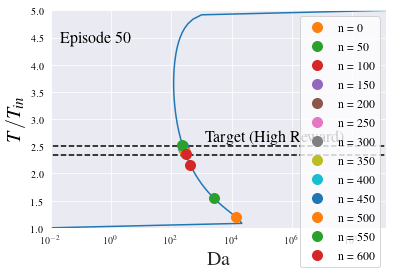

In [3]:
simulate("./data/onestep_steady.yml")